In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scipy.stats as st
import seaborn as sns
from mpmath import *
from decimal import Decimal
from timeit import default_timer as timer
import json

import tools as tl
import benchmark_func as bf
from hyperheuristic import Hyperheuristic
from metaheuristic import Metaheuristic
from experiment import read_config_file

In [2]:
sns.set(context="paper", font_scale=1.8, palette="husl", style="ticks",
        rc={'font.family': 'serif', 'font.size': 18,
            "xtick.major.top": False, "ytick.major.right": False})
plt.rc('font', size=18) 

# Saving images flag
is_saving = True
show_plots = True
saving_format = 'png'

figures_folder = 'data_files/exp_figures_last_comp/'
experiment_folder = 'data_files/exp_output'
ml_model_folder = "./data_files/ml_models_times/"
exp_label = 'default_nn_best_double_lstm'
bm_exp_label = 'basic_metaheuristic'

if is_saving:
    # Read (or create if so) a folder for storing images
    if not os.path.isdir(figures_folder):
        os.mkdir(figures_folder)

In [3]:
files = os.listdir(ml_model_folder)
files = [file for file in files if 'DS_S' not in file]

# Number of dimensions
dimensions = [2, 10, 30, 50]
num_dims = len(dimensions)

problems = list(set(file.split('-')[0] for file in files))
len(problems), dimensions

(119, [2, 10, 30, 50])

In [4]:
def sort_dataset(dataset):
    # Sort the results of the 428 problems in lexicographically order
    list_pair_results = list(zip(dataset['problem'],
                                 dataset['dimensions'],
                                 dataset['results']))
    list_pair_results.sort()
    dataset['problem'], dataset['dimensions'], dataset['results'] = [], [], []
    for problem, dimension, result in list_pair_results:
        dataset['problem'].append(problem)
        dataset['dimensions'].append(dimension)
        dataset['results'].append(result)
        
def filter_by_dimensions(dataset):
    # Filter the dataset allowing only the dimensions from 'dimensions' list.
    # The usercase is for the basic metaheuristics that has results for extra 
    # dimensions out of scope of this paper.
    allowed_dim_inds = [index for d in dimensions for index in tl.listfind(dataset['dimensions'], d)]
    dict_filtered = {key: [val[x] for x in allowed_dim_inds] for key, val in dataset.items()}
    sort_dataset(dict_filtered)
    return dict_filtered


In [5]:
# Read operators and find their alias
collections = ['default.txt', 'basicmetaheuristics.txt']

encoded_heuristic_space = dict()
for collection_file in collections:
    with open('./collections/' + collection_file, 'r') as operators_file:
        encoded_heuristic_space[collection_file] = [eval(line.rstrip('\n')) for line in operators_file]

# Search operator aliases
perturbator_alias = {
    'random_search': 'RS',
    'central_force_dynamic': 'CF',
    'differential_mutation': 'DM',
    'firefly_dynamic': 'FD',
    'genetic_crossover': 'GC',
    'genetic_mutation': 'GM',
    'gravitational_search': 'GS',
    'random_flight': 'RF',
    'local_random_walk': 'RW',
    'random_sample': 'RX',
    'spiral_dynamic': 'SD',
    'swarm_dynamic': 'PS'}

selector_alias = {'greedy': 'g', 'all': 'd', 'metropolis': 'm', 'probabilistic': 'p'}

operator_families = {y: i for i, y in enumerate(sorted([x for x in perturbator_alias.values()]))}

# Pre-build the alias list
heuristic_space = dict()
for collection_file in collections:
    if all(isinstance(x, tuple) for x in encoded_heuristic_space[collection_file]):
        heuristic_space[collection_file] = [perturbator_alias[x[0]] + selector_alias[x[2]]
                                            for x in encoded_heuristic_space[collection_file]]


In [6]:
# Read basic metaheuristics
basic_mhs_collection = encoded_heuristic_space['basicmetaheuristics.txt']

# Read basic metaheuristics cardinality
basic_mhs_cadinality = [1 if isinstance(x, tuple) else len(x) for x in basic_mhs_collection]

# Load data from basic metaheuristics
basic_mhs_data = filter_by_dimensions(tl.read_json(f'{experiment_folder}/basic-metaheuristics-data_v2.json'))

# Mathematical attributes
chosen_categories = ['Differentiable', 'Unimodal']
case_label = 'DU'

# Call the problem categories
problem_features = bf.list_functions(fts=chosen_categories)
categories = sorted(set([problem_features[x]['Code'] for x in basic_mhs_data['problem']]), reverse=True)


In [7]:
data = tl.read_json('./data_files/exp_output/'+exp_label+'.json')
# Retrive the results per experiment
data_frame = filter_by_dimensions(data)

# Summary
id = 'dlstm'
data_info = {
    'Dim': [int(x) for x in data_frame['dimensions']],
    'Pop': 30,
    'Problem': data_frame['problem'],
    'Cat': [problem_features[x]['Code'] for x in data_frame['problem']],
    'mhs': [x['encoded_solution'] for x in data_frame['results']],
    'hist': [x['hist_fitness'] for x in data_frame['results']]
}

In [8]:
results_bmhs = tl.read_json('bmhs_cec2005_results.json')
results_dlstm = tl.read_json('dlstm_cec2005_results.json')
results_from_trained = tl.read_json('dlstm_from_trained_model_cec2005_results.json')
data = tl.read_json('./data_files/exp_output/default_nn_best_double_lstm_CEC.json')
# Retrive the results per experiment
data_frame = filter_by_dimensions(data)

# Summary
id = 'dlstm_cec'
data_info = {
    'dimension': [int(x) for x in data_frame['dimensions']],
    'func_name': [x.split('_')[0] for x in data_frame['problem']],
    'mhs': [x['encoded_solution'] for x in data_frame['results']],
    'fitness': [x['hist_fitness'] for x in data_frame['results']]
}

In [9]:
def get_all_ids(func_name_, dimension_, data):
    ids = []
    for i, (f_name, dim) in enumerate(zip(data['func_name'], data['dimension'])):
        if func_name_ == f_name and dimension_ == dim:
            ids.append(i)
    return ids
def join_fitness(ids, data):
    fitness = []
    for id in ids:
        fitness = fitness + data['fitness'][id]
    return fitness
cec_relation = {
  'F1': ['Sphere'],
  'F2': ['Schwefel12'],# 'Schwefel'],
  'F4': ['Schwefel'],# 'Schwefel12'],
  'F5': ['Schwefel226'],# 'Schwefel'],
  'F6': ['Rosenbrock'],
  'F7': ['Griewank'],
  'F8': ['Ackley1'],# 'Ackley4'],
  'F9': ['Rastrigin'],
  'F10': ['Rastrigin'],
  'F11': ['Weierstrass'],
  'F13': ['Rosenbrock', 'Griewank'],
  'F14': ['SchafferN1']#, 'SchafferN2', 'SchafferN3', 'SchafferN4', 'SchafferN6'],
}


In [22]:

problems_cec = [
    "F1","F2","F4","F5","F6","F7","F8","F9","F10","F11","F13","F14"
    ]
important_problems = [(prob_name, dim) for prob_name in problems_cec for dim in dimensions]



plt.rc('font', size=22)     # family='serif',

plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.titlesize'] = 22

def prove_comparison_fitness(subset_to_use, sort_by_fitness, hide_outlayers=False):
        
    plt.rc('font', size=22)     # family='serif',

    plt.rcParams['axes.labelsize'] = 22
    plt.rcParams['axes.titlesize'] = 22
    for func_name, dimension in important_problems:
        ids_bmhs = [0]
        ids_benchmark = [0]
        ids_from_trained = [0]
        ids_specific = [0]
        if 0 in subset_to_use:
            ids_bmhs = get_all_ids(func_name, dimension, results_bmhs)
        if 1 in subset_to_use:
            ids_benchmark = get_all_ids(func_name, dimension, results_dlstm)
        if 2 in subset_to_use:
            ids_from_trained = get_all_ids(func_name, dimension, results_from_trained)
        if 3 in subset_to_use:
            ids_specific = get_all_ids(func_name, dimension, data_info)

        fitprep = join_fitness(ids_bmhs, results_bmhs)
        fitprep2 = join_fitness(ids_benchmark, results_dlstm)
        fitprep3 = join_fitness(ids_from_trained, results_dlstm)
        fitprep4 = join_fitness(ids_specific, data_info)

        fitprep.sort(key = lambda w: w[-1], reverse=True)
        fitprep2.sort(key = lambda w: w[-1], reverse=True)
        fitprep3.sort(key = lambda w: w[-1], reverse=True)
        fitprep4.sort(key = lambda w: w[-1], reverse=True)

        colours = plt.cm.get_cmap('Reds')(np.linspace(0, 1, len(fitprep)))
        colours2 = plt.cm.get_cmap('Blues')(np.linspace(0, 1, len(fitprep2)))
        colours3 = plt.cm.get_cmap('Greens')(np.linspace(0, 1, len(fitprep3)))
        colours4 = plt.cm.get_cmap('Purples')(np.linspace(0, 1, len(fitprep4)))
        #colours = ['tab:red' for _ in fitprep]
        #colours2 = ['tab:blue' for _ in fitprep]
        #colours3 = ['tab:green' for _ in fitprep]
        
        label = [None for _ in fitprep]
        label2 = [None for _ in fitprep2]
        label3 = [None for _ in fitprep3]
        label4 = [None for _ in fitprep4]
        label[-1] = 'Basic MHs'
        label2[-1] = 'MHs from a similar problem'
        label3[-1] = 'MHs generated from a trained model'
        label4[-1] = 'MHs specifics'
        
        #plt.cm.get_cmap
        
        xc = np.array(list(zip(fitprep, colours, label)))[list(range(0, len(fitprep), 1))]
        xc2 = np.array(list(zip(fitprep2, colours2, label2)))[list(range(0, len(fitprep2), 1))]
        xc3 = np.array(list(zip(fitprep3, colours3, label3)))[list(range(0, len(fitprep3), 1))]
        xc4 = np.array(list(zip(fitprep4, colours4, label4)))[list(range(0, len(fitprep4), 1))]
        
        fi1 = plt.figure(figsize=(8, 3.5))
        """
        for x, c, l in xc:
            plt.plot(x, '-o', color=c, alpha=0.3, label=l)
        for x, c, l in xc2:
            plt.plot(x, '-o', color=c, alpha=0.3, label=l)
        for x, c, l in xc3:
            plt.plot(x, '-o', color=c, alpha=0.3, label=l)
        """
        all_xc = []
        for id, arr in enumerate([xc, xc2, xc3, xc4]):
            if id in subset_to_use:
                all_xc = all_xc + list(arr)
        #all_xc = list(xc)+list(xc2)+list(xc3)+list(xc4)
        if sort_by_fitness:
            all_xc.sort(key = lambda w: w[0][-1], reverse=True)
        for x, c, l in all_xc:
            plt.plot(x, '-o', color=c, alpha=0.1 if l is None else 0.5, label=l)

        plt.legend(loc='best', prop={'size': 15})
        #title = lstmdata['problem'][idx] + f'-{lstmdata["dimensions"][idx]}D'
        #plt.title(title)
        title = f'{func_name}-{dimension}D ({"-".join(cec_relation[func_name])})'
        plt.title(title)
        plt.xlabel('Step')
        plt.ylabel('Fitness')
        #if is_saving:
        fi1.subplots_adjust()
        fi1.tight_layout()
        plt.savefig(figures_folder + f'comparison_options{"_".join(str(x) for x in subset_to_use)}_{title}.' + saving_format,
                    format=saving_format,bbox_inches = 'tight', dpi=333, transparent=True)
        print(func_name, dimension)

        plt.show()

In [21]:
subsets = [[0, 1], [0, 2], [0, 3], [0, 1, 2, 3]]
case_names = ['1st option', '2nd option', '3rd option', 'all options']
pages = ['1st page', '2nd page', '3rd page', '4th page', '5th page']
figures_per_page = [8, 10, 10, 10, 10]

appendix_names = [
  "CEC Problems: Previously Generated Metaheuristics",
  "CEC Problems: Generated Metaheuristics From Trained Model",
  "CEC Problems: Trained Model From Scratch",
  "CEC Problems: All Strategies",
]

appendix_descriptions = [
  "This appendix contains the results described on the analysis of Section \\ref{sec:prev_mhs}. Metaheuristics previously generated for a similar function are applied to a CEC problem. It is tested on the dimensions 2, 10, 30, and 50 against the basic metaheuristics.",
  "This appendix contains the results described on the analysis of Section \\ref{sec:gen_mhs}. Metaheuristics generated from a model trained on a similar function are applied to a CEC problem. It is tested on the dimensions 2, 10, 30, and 50 against the basic metaheuristics.",
  "This appendix contains the results described on the analysis of Section \\ref{sec:train_mhs}. Metaheuristics generated from a model trained specifically for each CEC problem. It is tested on the dimensions 2, 10, 30, and 50 against the basic metaheuristics.",
  "This appendix contains the results described on the analysis of Section \\ref{sec:all_mhs}. All the metaheuristics generated from the options proposed in the introduction of Chapter \\ref{chap:appl_mhs} are applied to a CEC problem. It is tested on the dimensions 2, 10, 30, and 50 against the basic metaheuristics.",
]

header = """
\\begin{figure}[!ht] 
        \centering
"""
print("\\appendix")
for subset_to_use, case_name, appendix_name, description in zip(subsets, case_names, appendix_names, appendix_descriptions):
  figure_names = {}
  
  for func_name, dimension in important_problems:
    
    title = f'{func_name}-{dimension}D ({"-".join(cec_relation[func_name])})'
    figure_name = 'figures/' + f'comparison_options{"_".join(str(x) for x in subset_to_use)}_{title}.' + saving_format
    figure_line = f'\\includegraphics[width=0.45\\textwidth]{{{figure_name}}}'
    if func_name not in figure_names:
      figure_names[func_name] = []
    figure_names[func_name].append(figure_line)
  
  
  # Initialize chapter
  print("\\chapter{" + appendix_name + "}\n\\label{Appendix:"+case_name.replace(' ', '_')+"}")
  print(description)
  print("\n\\vspace{0.4cm}")
  
  for idx_n, (func_name, figure_files) in enumerate(figure_names.items()):
    print("\\textbf{\\Large " + func_name + " - " + "-".join(cec_relation[func_name])+"}")
    print("")
    bottom = """
      \label{fig:""" + case_name + "_"+func_name.split(' ')[0]+"""cec_problems}
    \end{figure}
    """
    print(header)
    for idx, figure_line in enumerate(figure_files):
      print('  ', figure_line)
      if idx % 2 == 1:
        print('')    
    print(bottom)  
    if idx_n % 3 == 0:
      print("\\newpage")
  
  
  def printSplitted():
    for name_page, num_figures in zip(pages, figures_per_page):
      bottom = """
          \caption{Historical evolution fitness of MHs on CEC problems (""" + \
            case_name + ", " + name_page + """).}
          \label{fig:""" +case_name+"_"+name_page.split(' ')[0]+"""cec_problems}
      \end{figure}
      """
      
      print(header)
      for idx, figure_line in enumerate(figure_names[:num_figures]):
        print('  ', figure_line)
        if idx % 2 == 1:
          print('')    
      figure_names = figure_names[num_figures:]
      print(bottom)    
  
    

\appendix
\chapter{CEC Problems: Previously Generated Metaheuristics}
\label{Appendix:1st_option}
This appendix contains the results described on the analysis of Section \ref{sec:prev_mhs}. Metaheuristics previously generated for a similar function are applied to a CEC problem. It is tested on the dimensions 2, 10, 30, and 50 against the basic metaheuristics.

\vspace{0.4cm}
\textbf{\Large F1 - Sphere}


\begin{figure}[!ht] 
        \centering

   \includegraphics[width=0.45\textwidth]{figures/comparison_options0_1_F1-2D (Sphere).png}
   \includegraphics[width=0.45\textwidth]{figures/comparison_options0_1_F1-10D (Sphere).png}

   \includegraphics[width=0.45\textwidth]{figures/comparison_options0_1_F1-30D (Sphere).png}
   \includegraphics[width=0.45\textwidth]{figures/comparison_options0_1_F1-50D (Sphere).png}


      \label{fig:1st option_F1cec_problems}
    \end{figure}
    
\newpage
\textbf{\Large F2 - Schwefel12}


\begin{figure}[!ht] 
        \centering

   \includegraphics[width=0

In [11]:
COLOR = 'black'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

F1 2


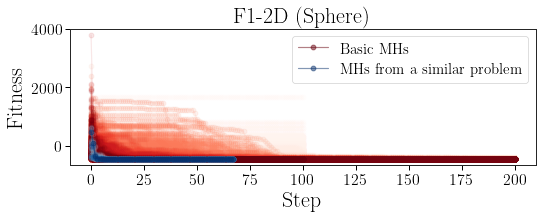

F1 10


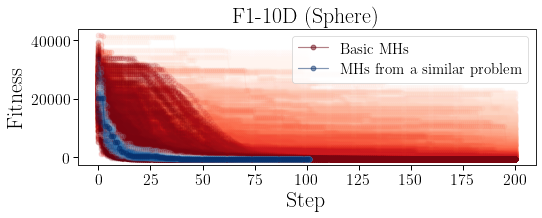

F1 30


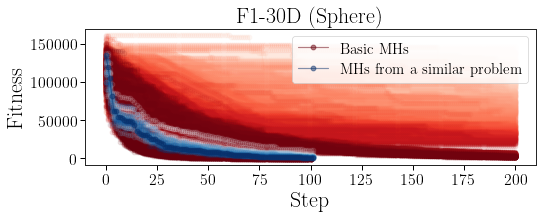

F1 50


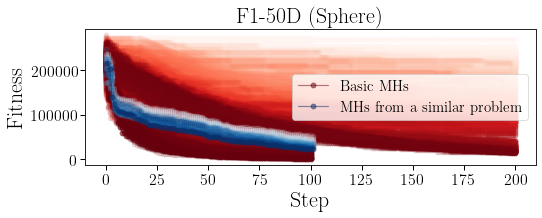

F2 2


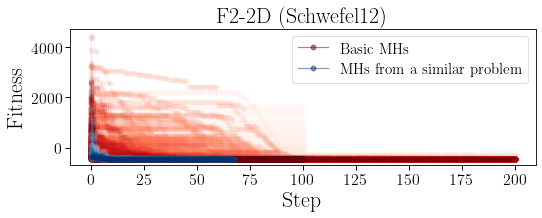

F2 10


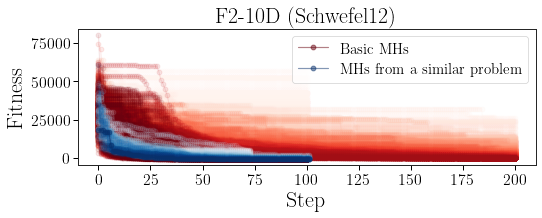

F2 30


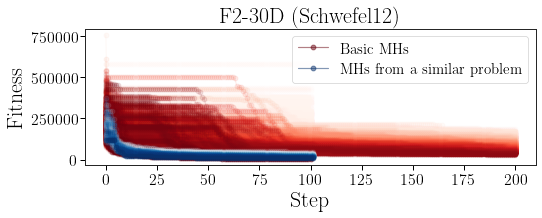

F2 50


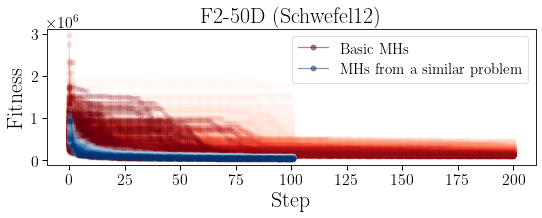

F4 2


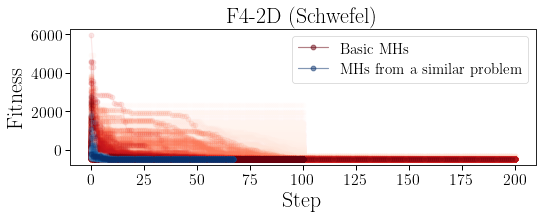

F4 10


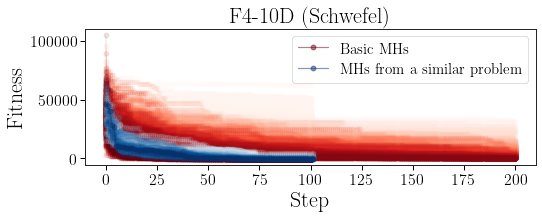

F4 30


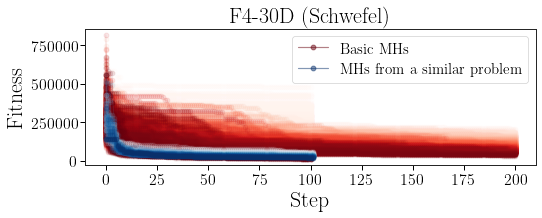

F4 50


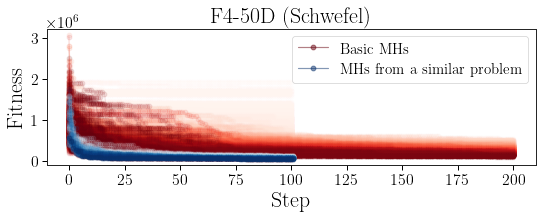

F5 2


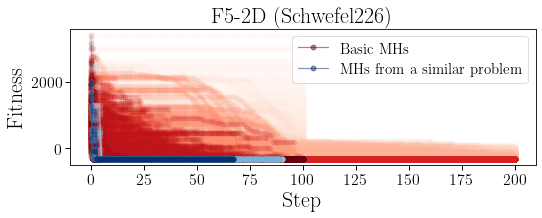

F5 10


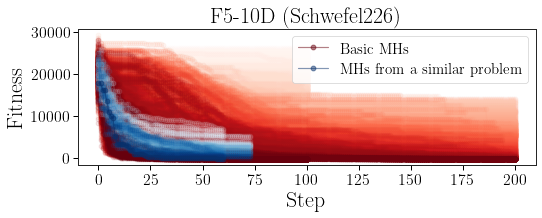

F5 30


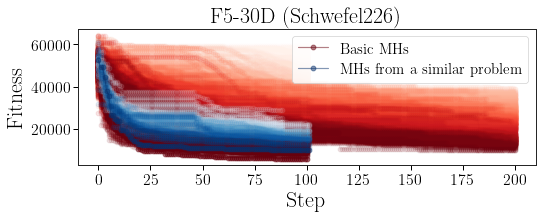

F5 50


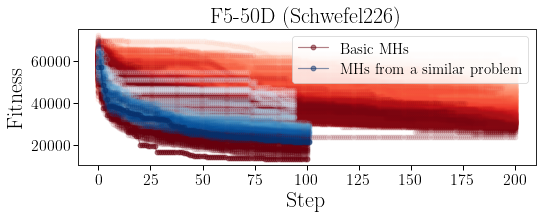

F6 2


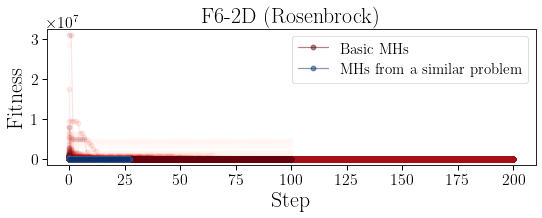

F6 10


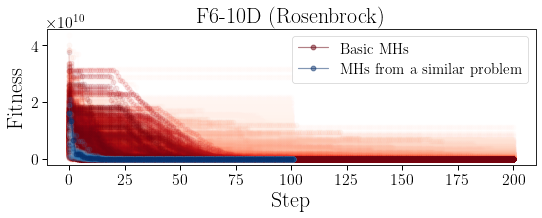

F6 30


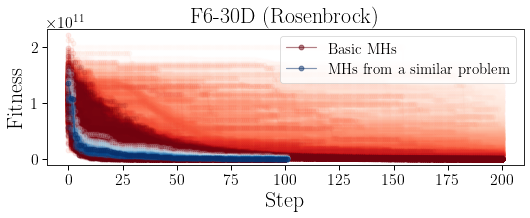

F6 50


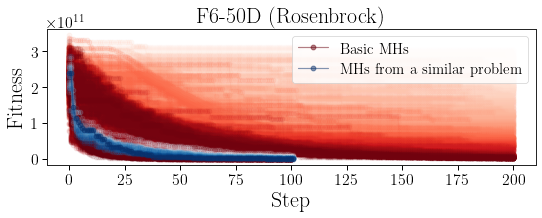

F7 2


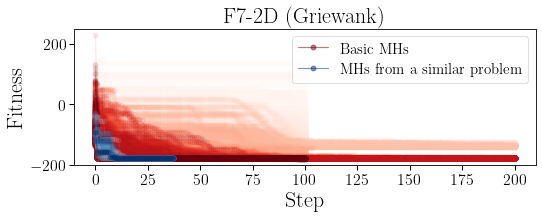

F7 10


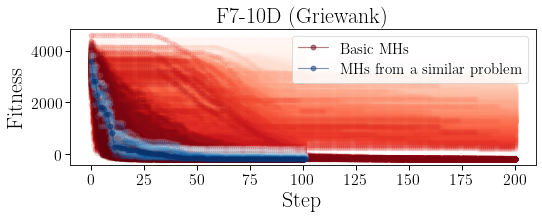

F7 30


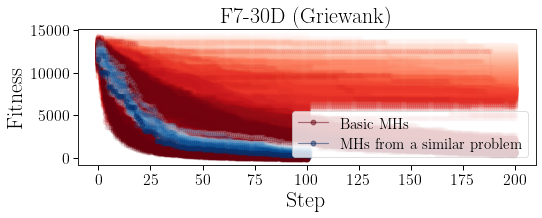

F7 50


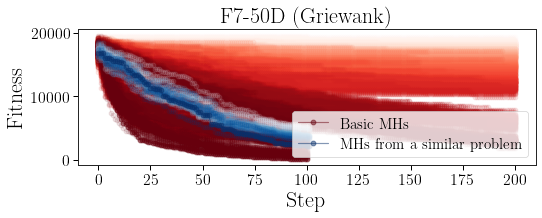

F8 2


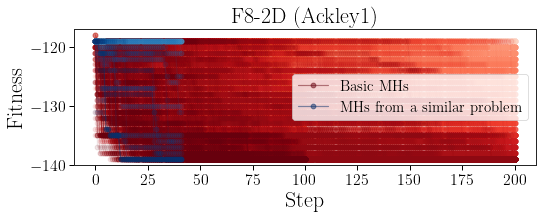

F8 10


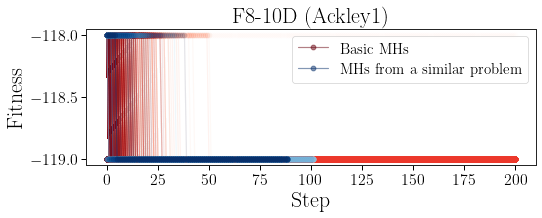

F8 30


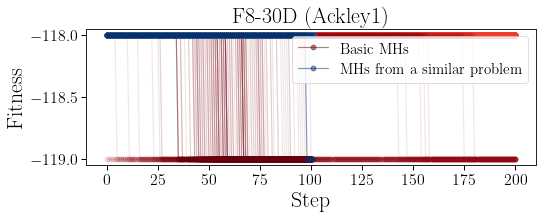

F8 50


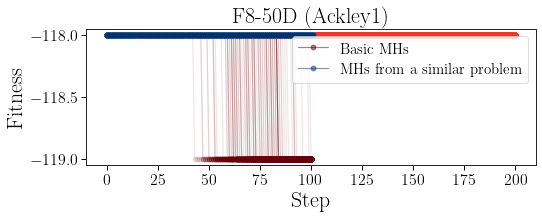

F9 2


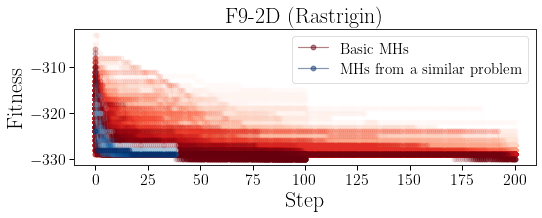

F9 10


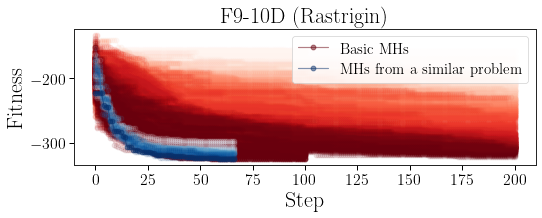

F9 30


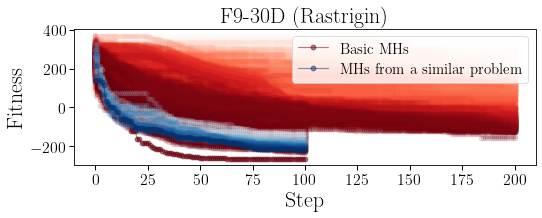

F9 50


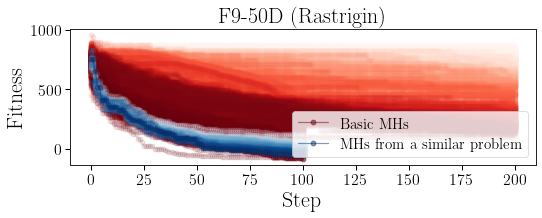

F10 2


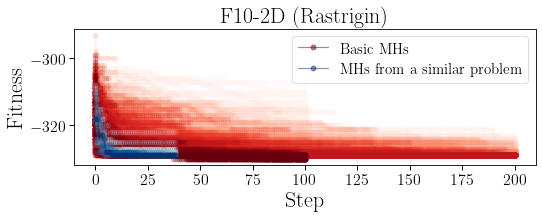

F10 10


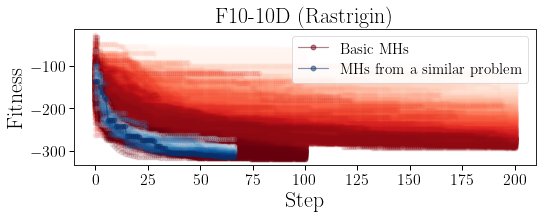

F10 30


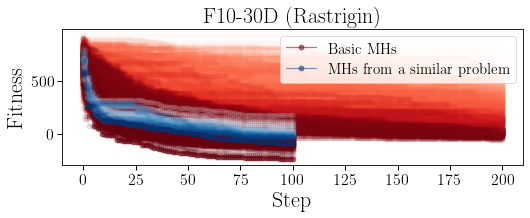

F10 50


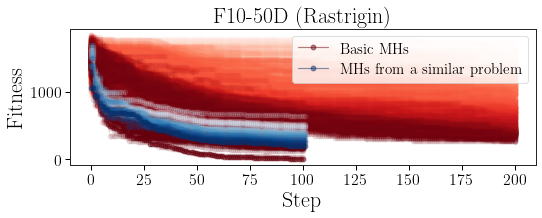

F11 2


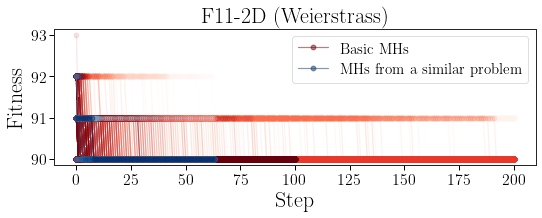

F11 10


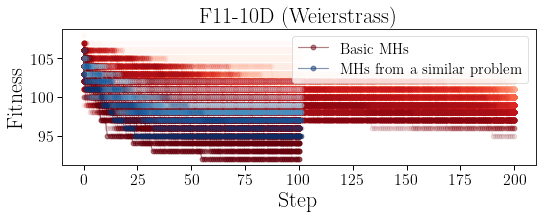

F11 30


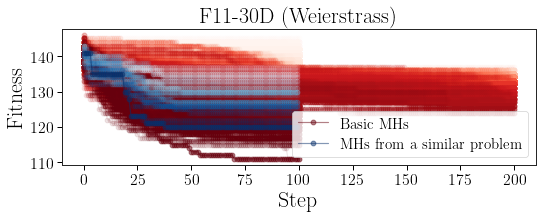

F11 50


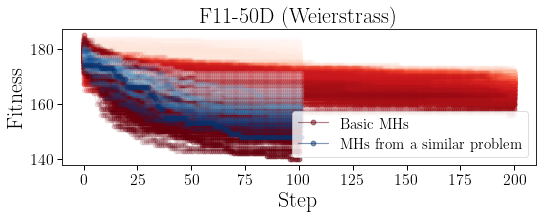

F13 2


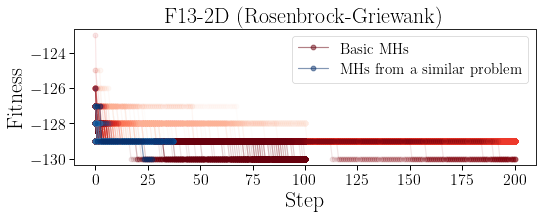

F13 10


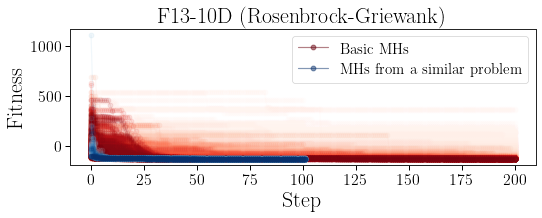

F13 30


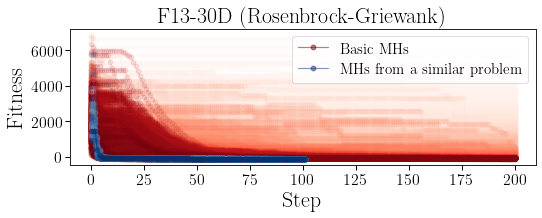

F13 50


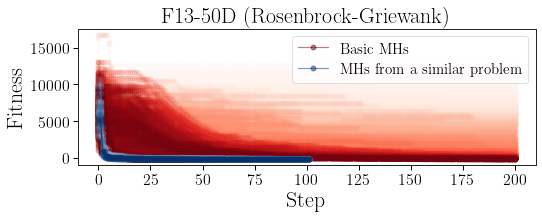

F14 2


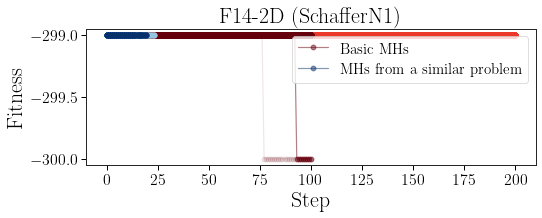

F14 10


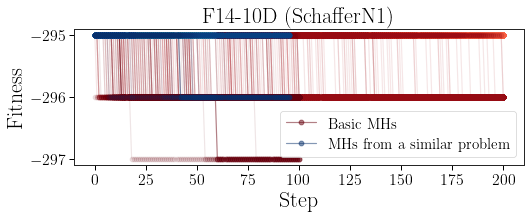

F14 30


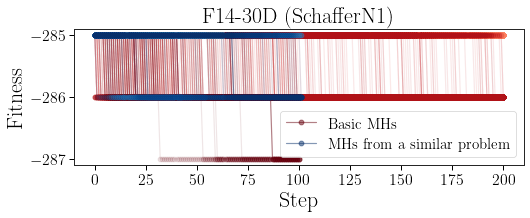

F14 50


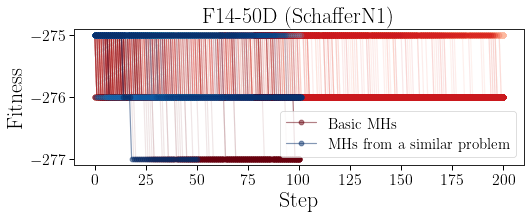

In [23]:
prove_comparison_fitness([0, 1], False)

F1 2


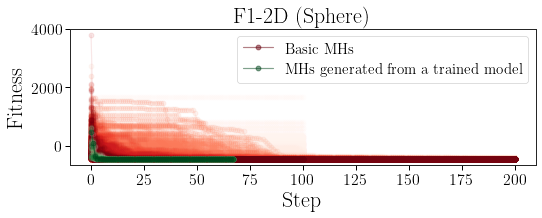

F1 10


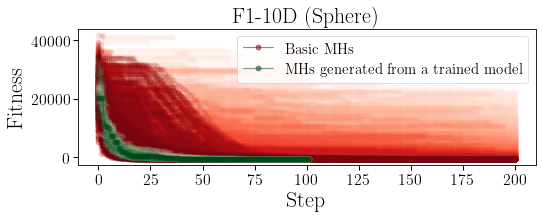

F1 30


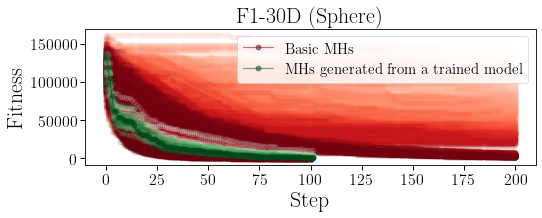

F1 50


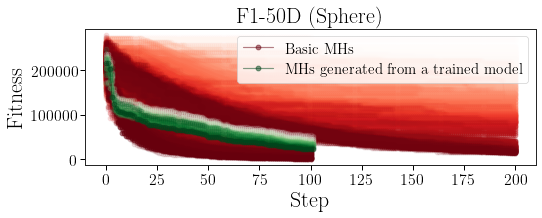

F2 2


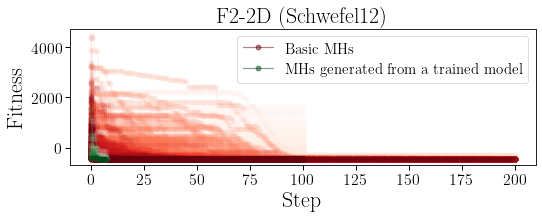

F2 10


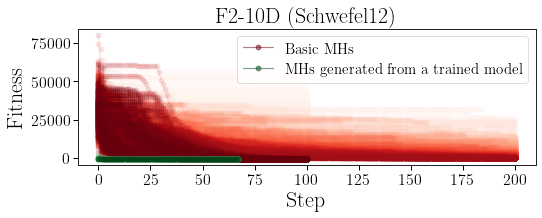

F2 30


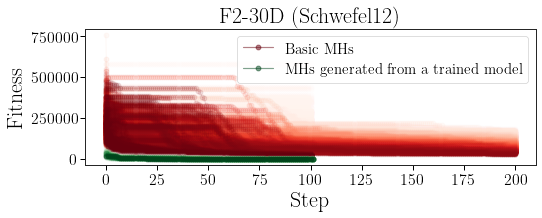

F2 50


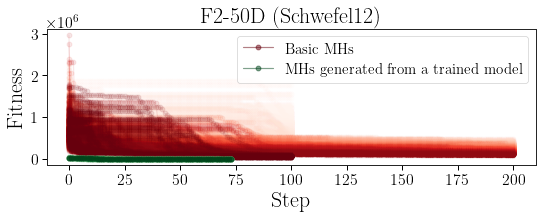

F4 2


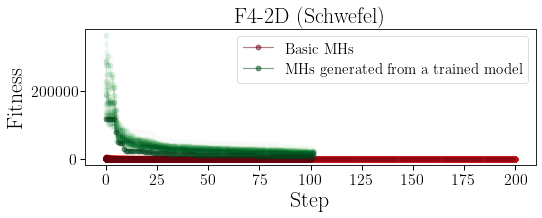

F4 10


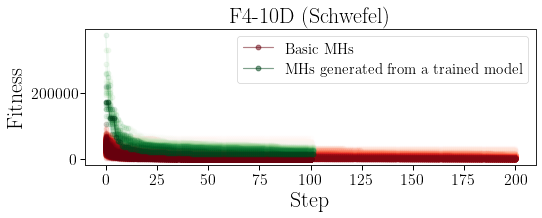

F4 30


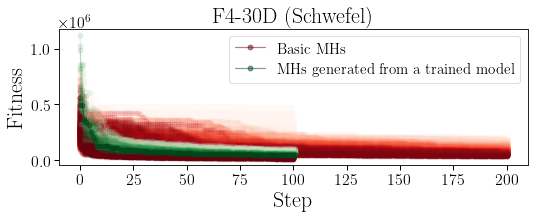

F4 50


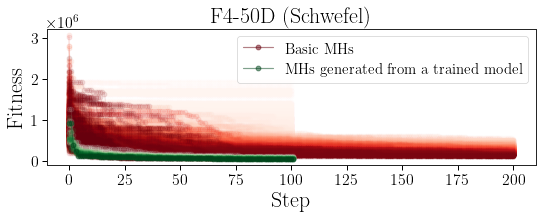

F5 2


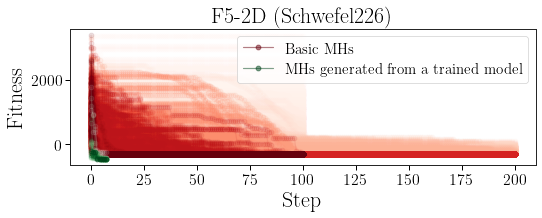

F5 10


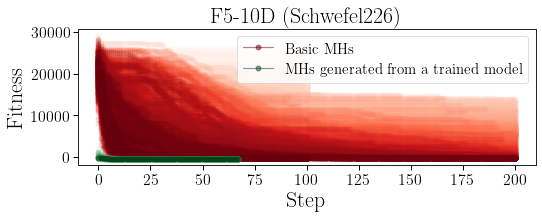

F5 30


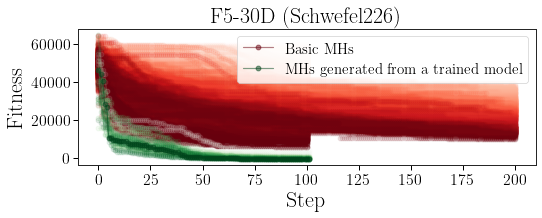

F5 50


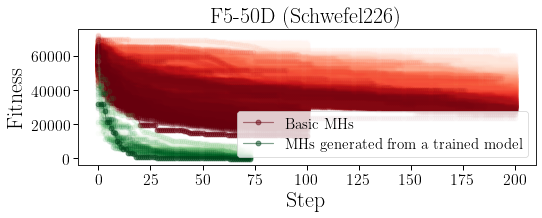

F6 2


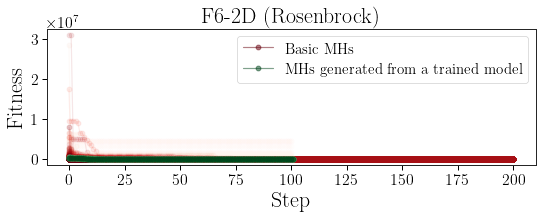

F6 10


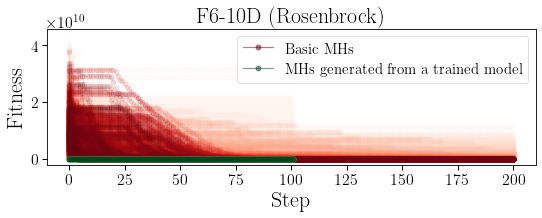

F6 30


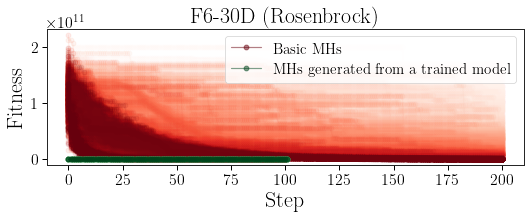

F6 50


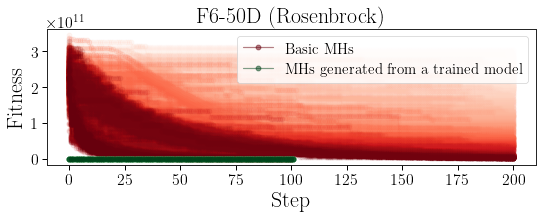

F7 2


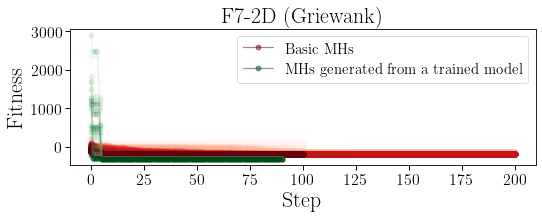

F7 10


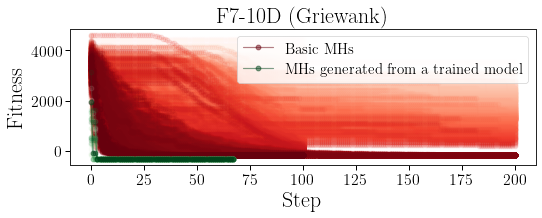

F7 30


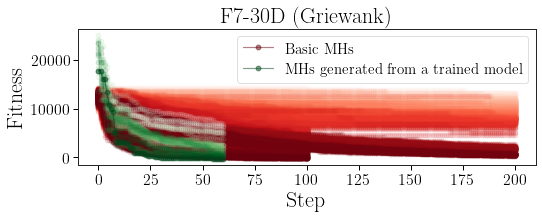

F7 50


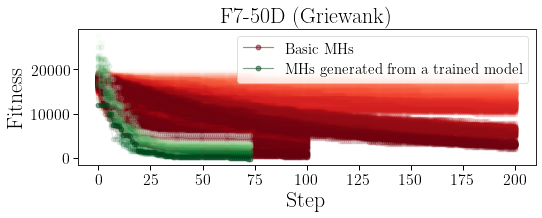

F8 2


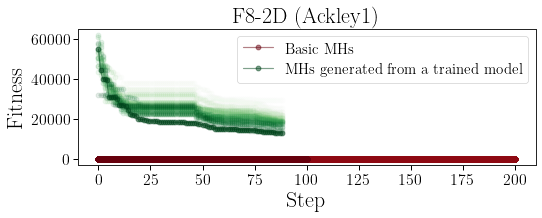

F8 10


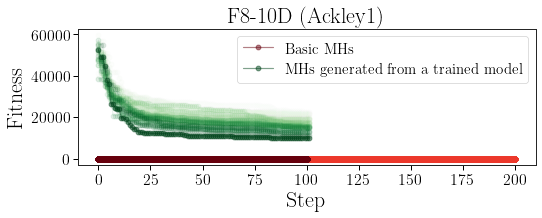

F8 30


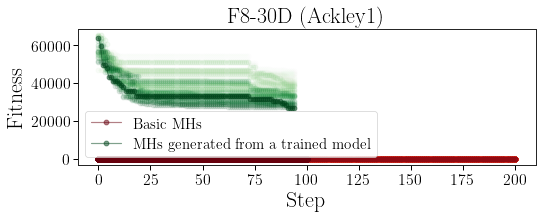

F8 50


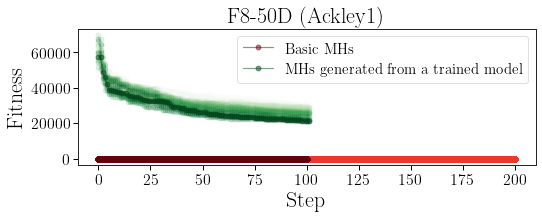

F9 2


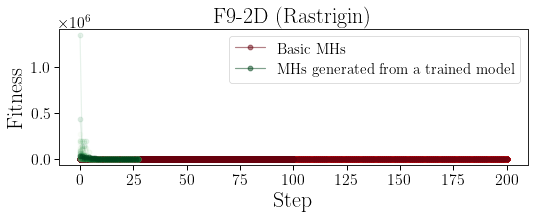

F9 10


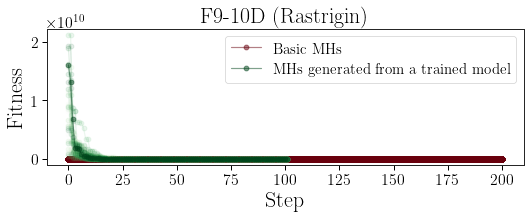

F9 30


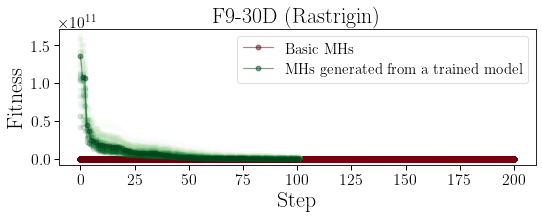

F9 50


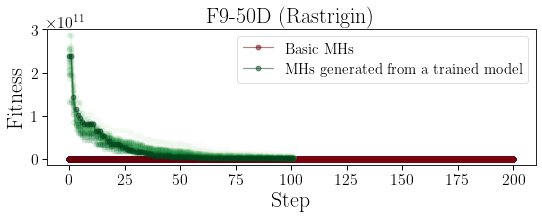

F10 2


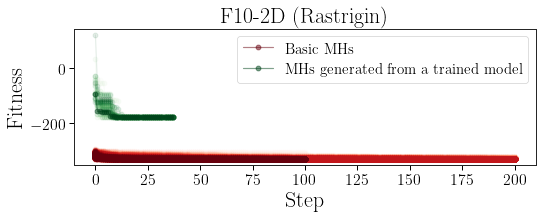

F10 10


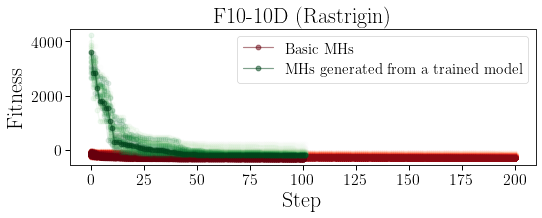

F10 30


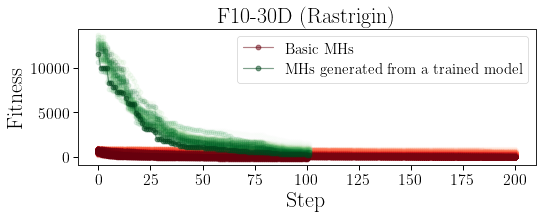

F10 50


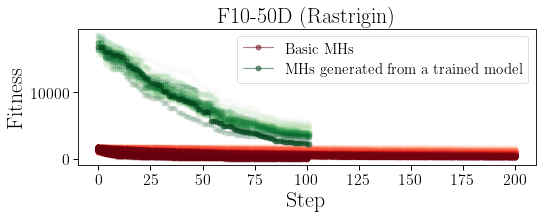

F11 2


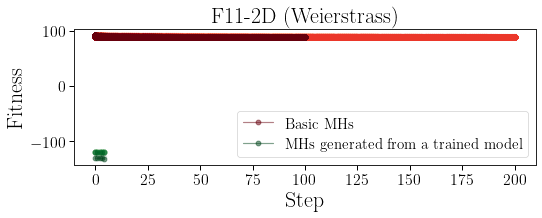

F11 10


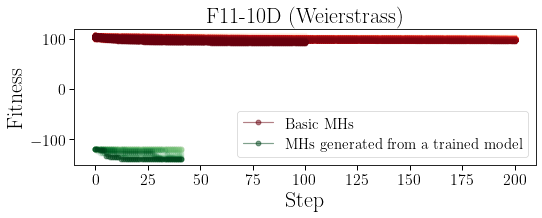

F11 30


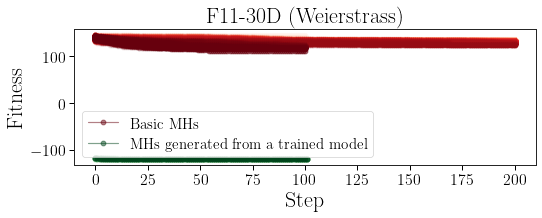

F11 50


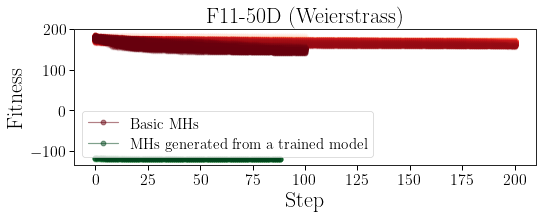

F13 2


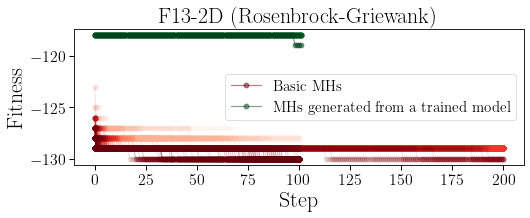

F13 10


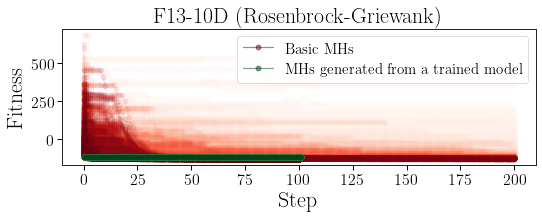

F13 30


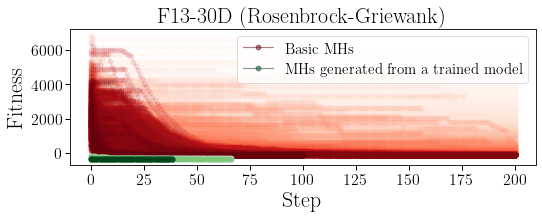

F13 50


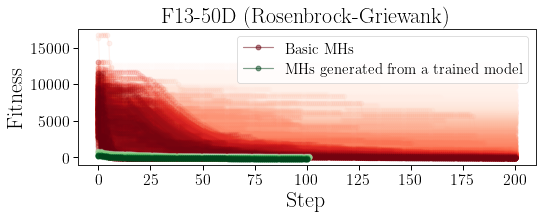

F14 2


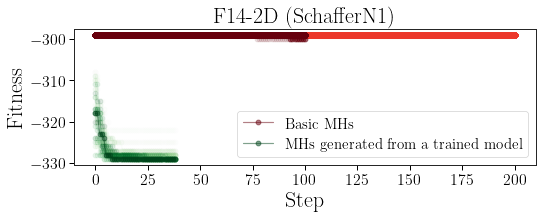

F14 10


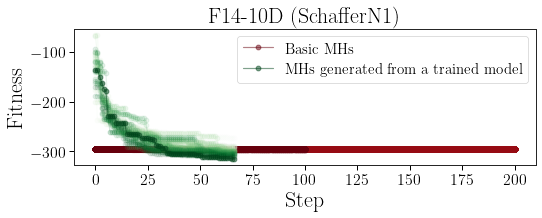

F14 30


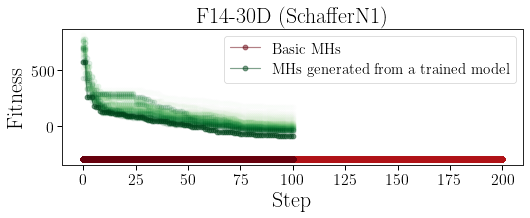

F14 50


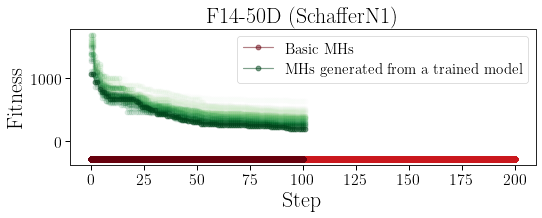

In [24]:
prove_comparison_fitness([0, 2], False)

F1 2


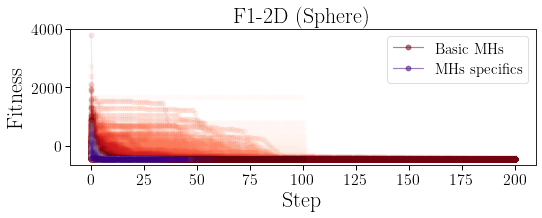

F1 10


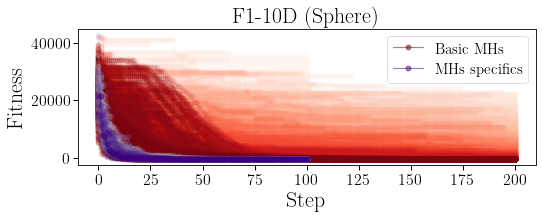

F1 30


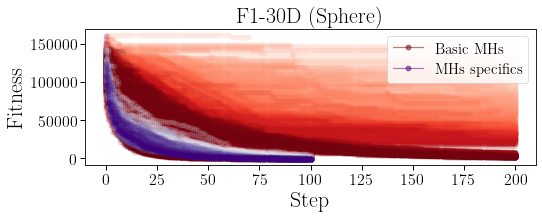

F1 50


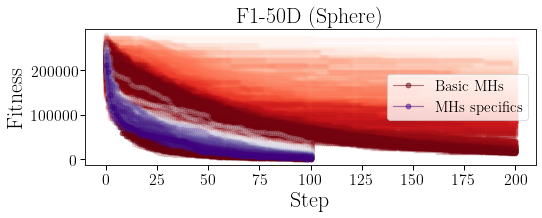

F2 2


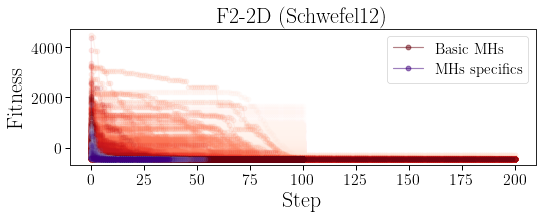

F2 10


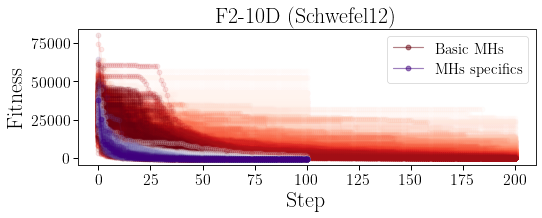

F2 30


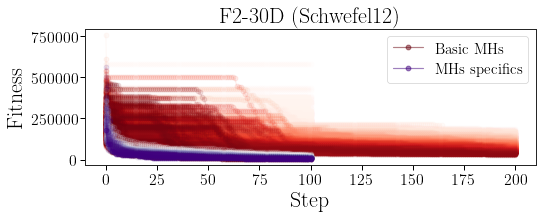

F2 50


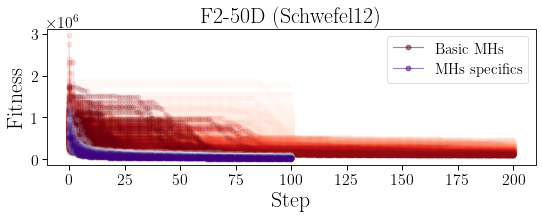

F4 2


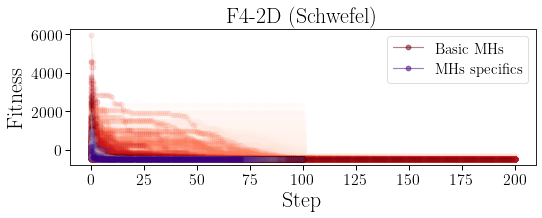

F4 10


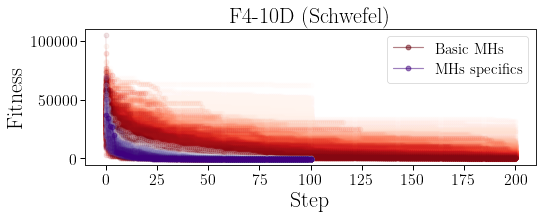

F4 30


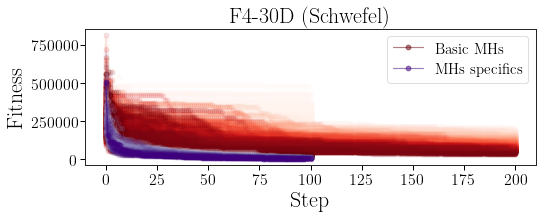

F4 50


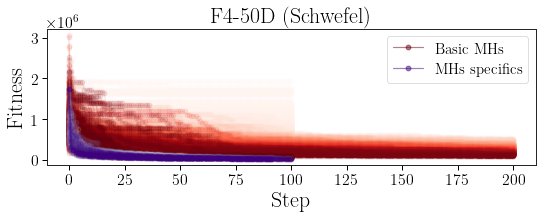

F5 2


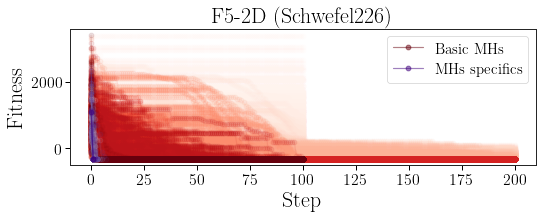

F5 10


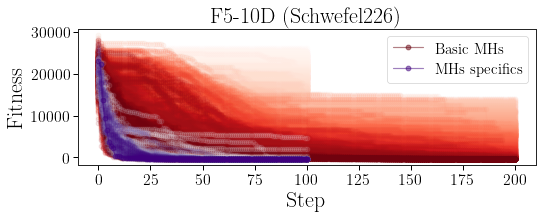

F5 30


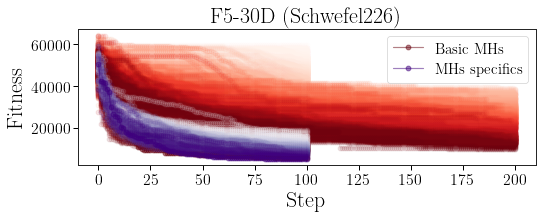

F5 50


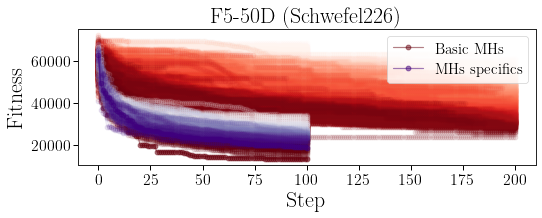

F6 2


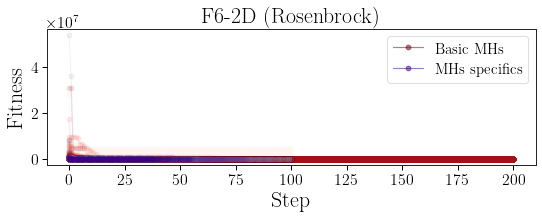

F6 10


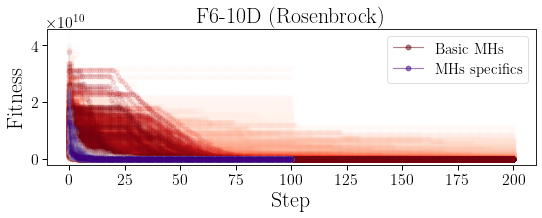

F6 30


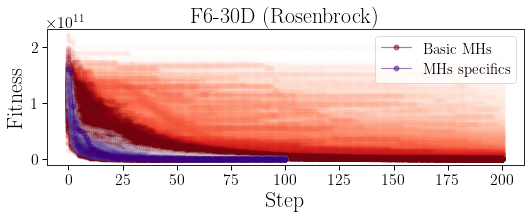

F6 50


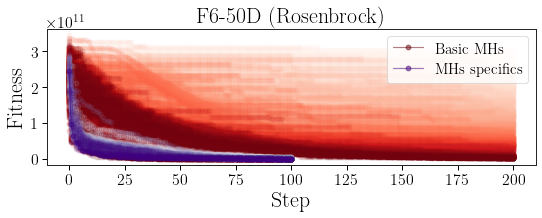

F7 2


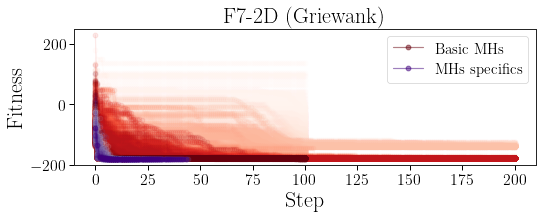

F7 10


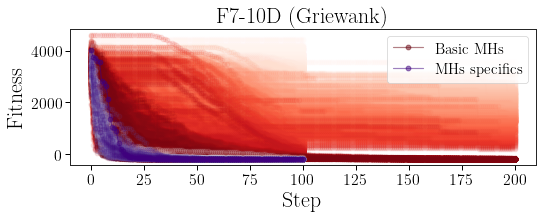

F7 30


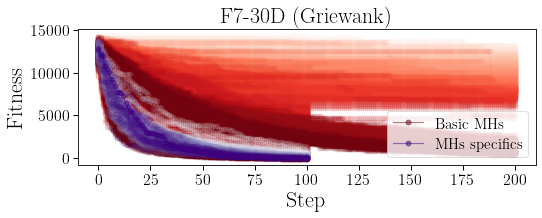

F7 50


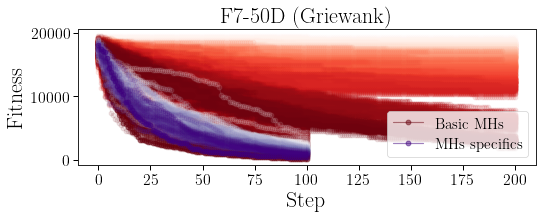

F8 2


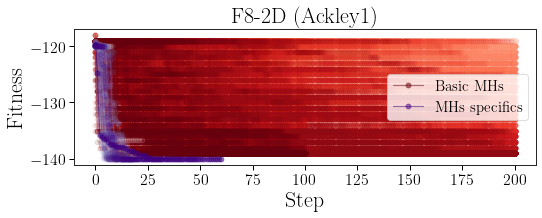

F8 10


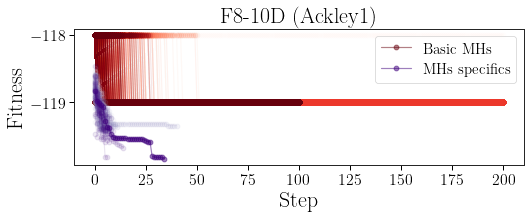

F8 30


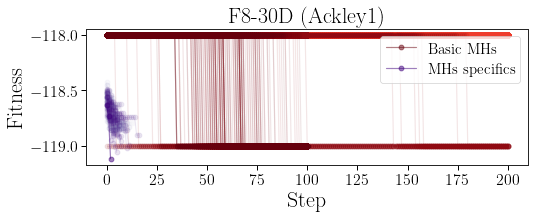

F8 50


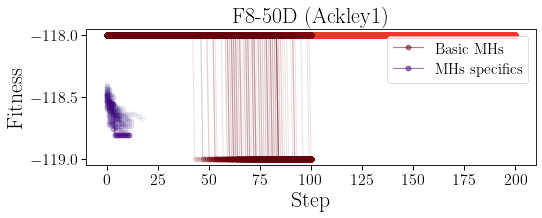

F9 2


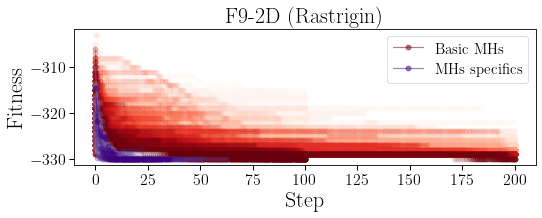

F9 10


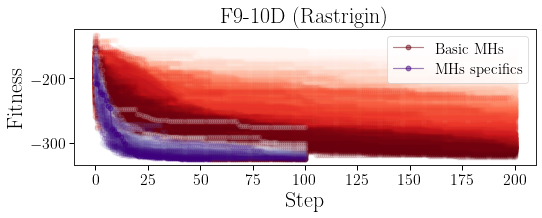

F9 30


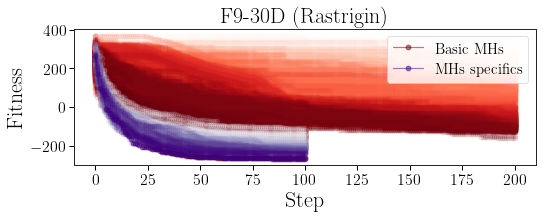

F9 50


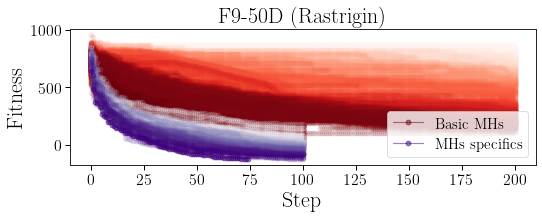

F10 2


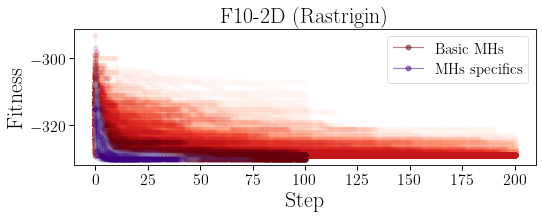

F10 10


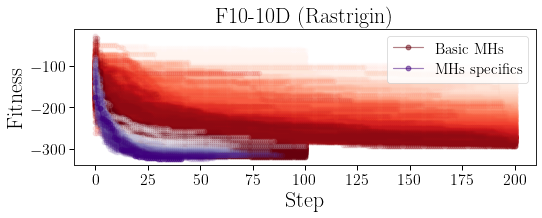

F10 30


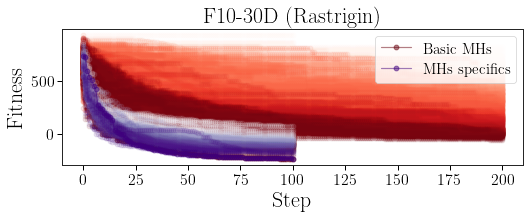

F10 50


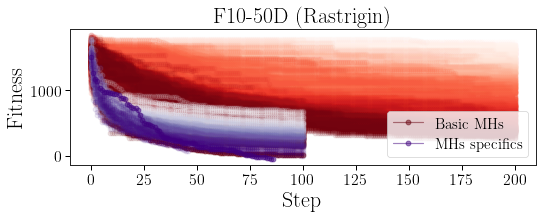

F11 2


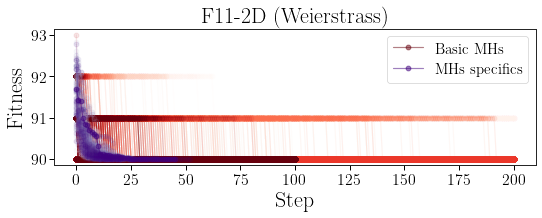

F11 10


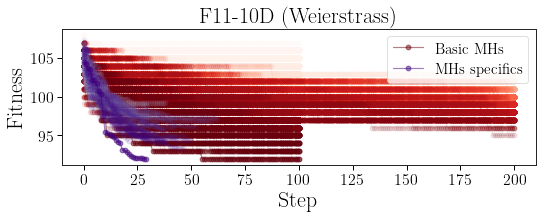

F11 30


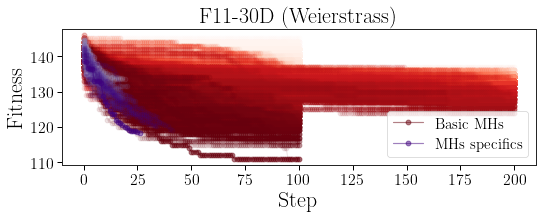

F11 50


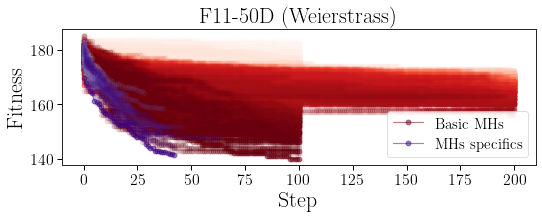

F13 2


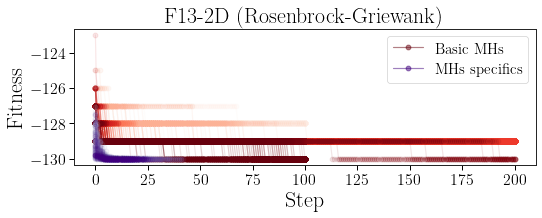

F13 10


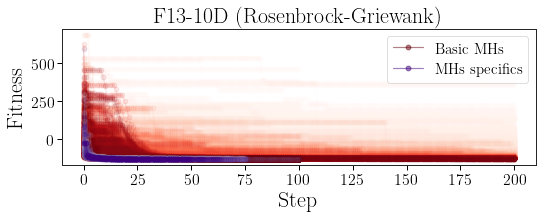

F13 30


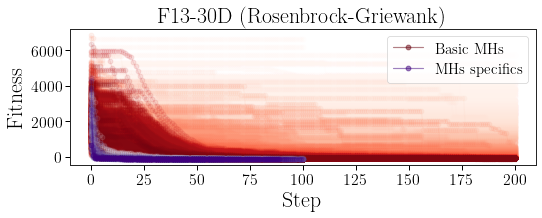

F13 50


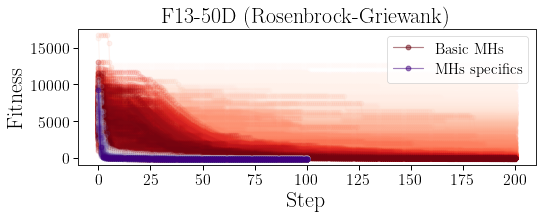

F14 2


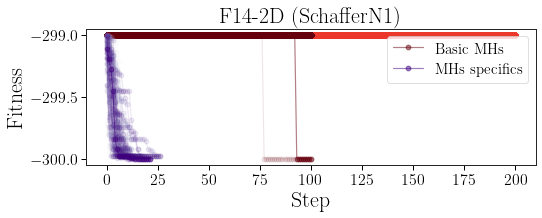

F14 10


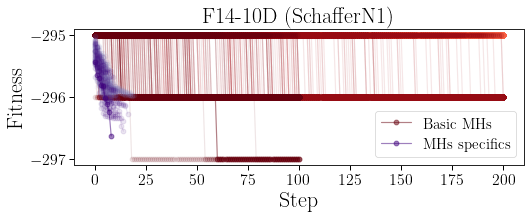

F14 30


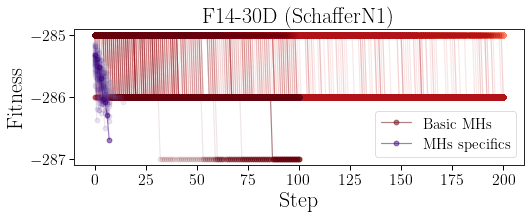

F14 50


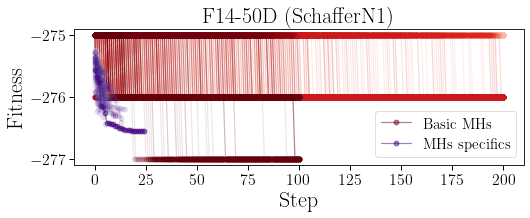

In [25]:
prove_comparison_fitness([0, 3], False)

F1 2


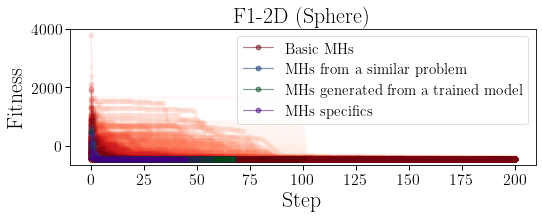

F1 10


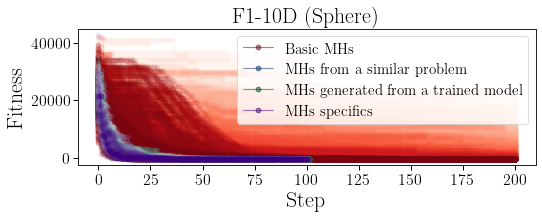

F1 30


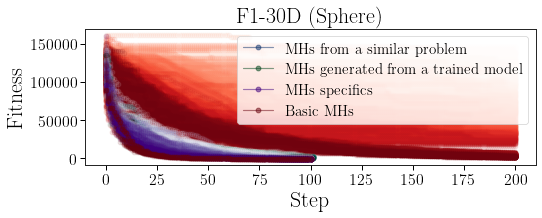

F1 50


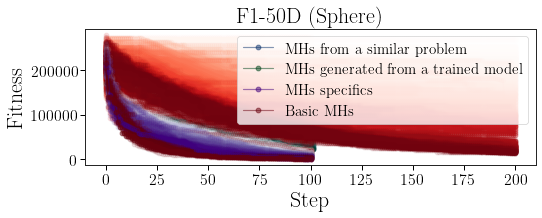

F2 2


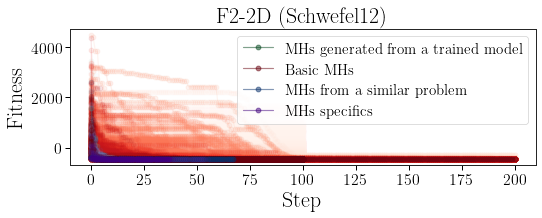

F2 10


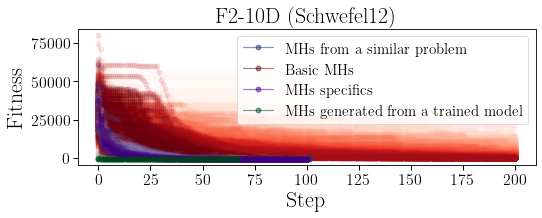

F2 30


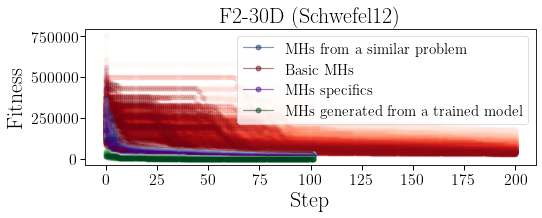

F2 50


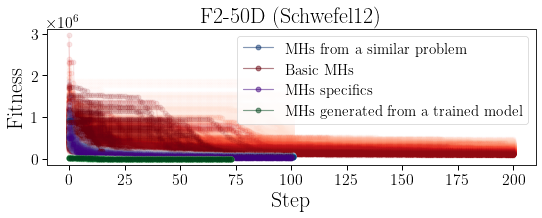

F4 2


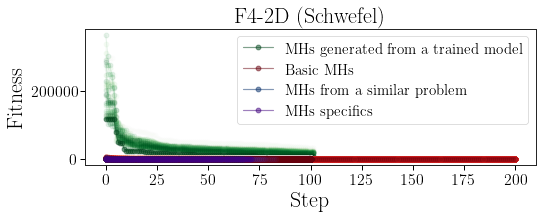

F4 10


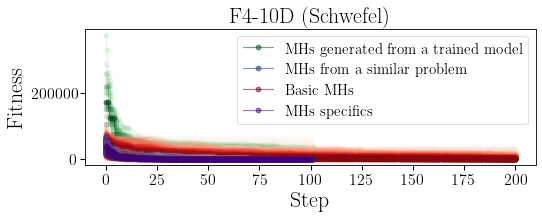

F4 30


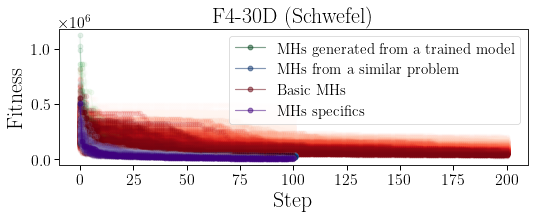

F4 50


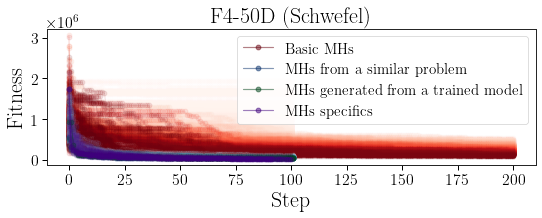

F5 2


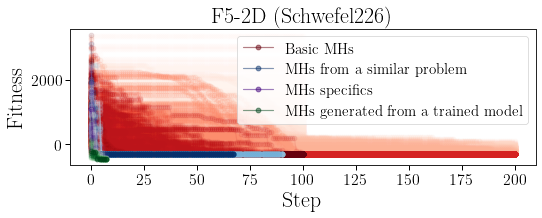

F5 10


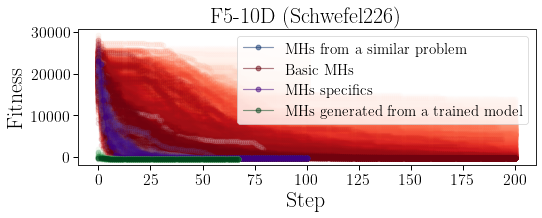

F5 30


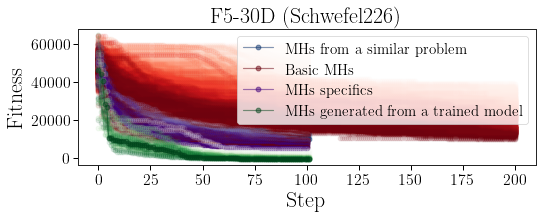

F5 50


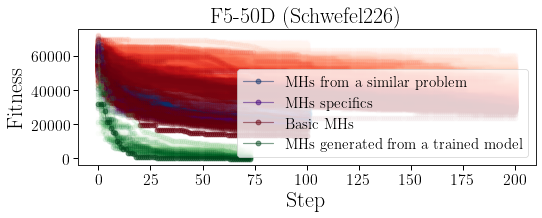

F6 2


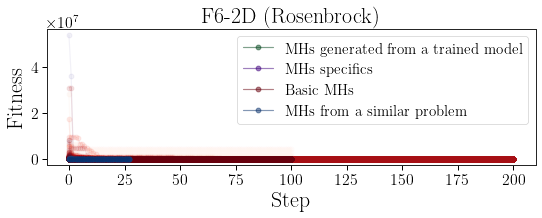

F6 10


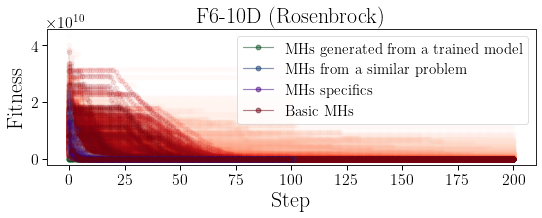

F6 30


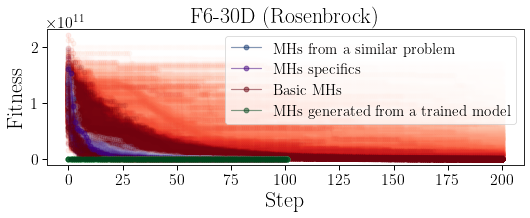

F6 50


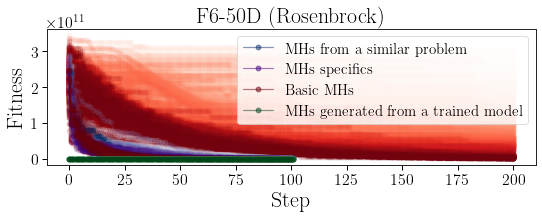

F7 2


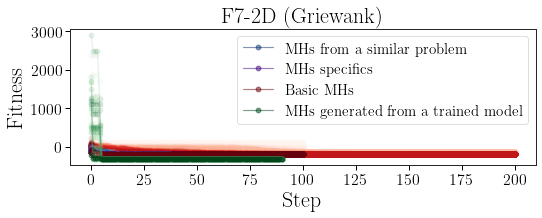

F7 10


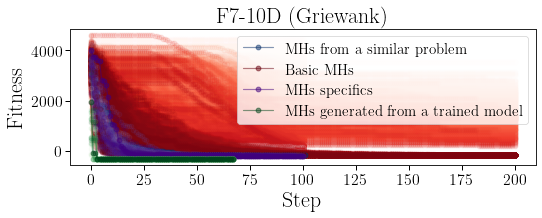

F7 30


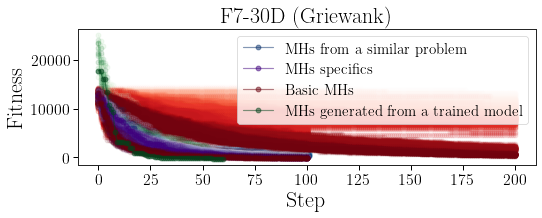

F7 50


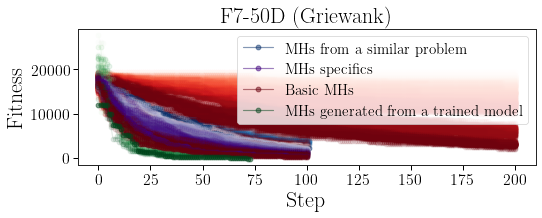

F8 2


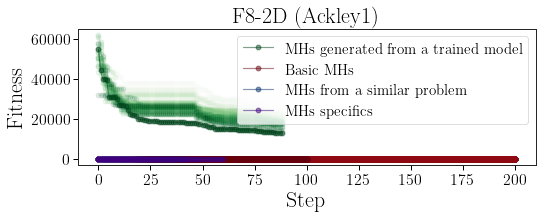

F8 10


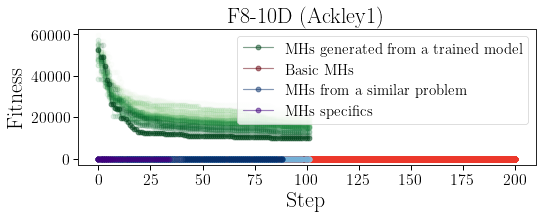

F8 30


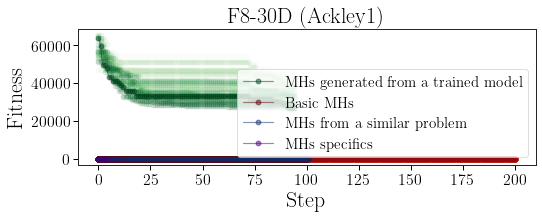

F8 50


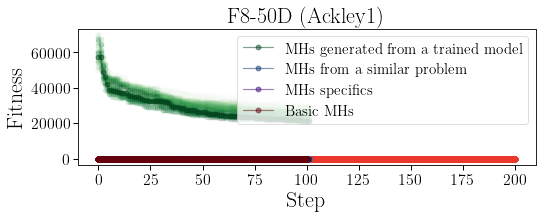

F9 2


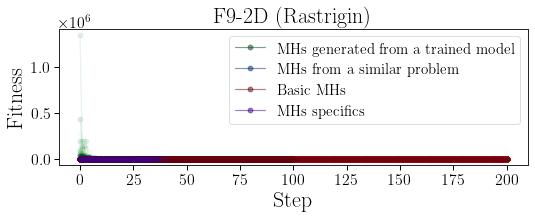

F9 10


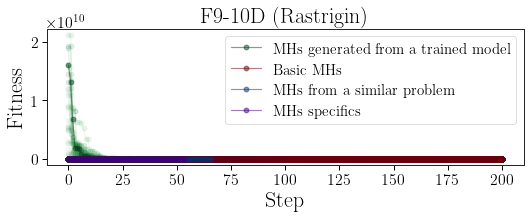

F9 30


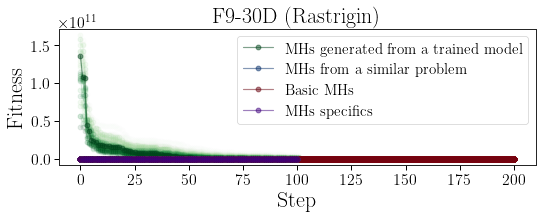

F9 50


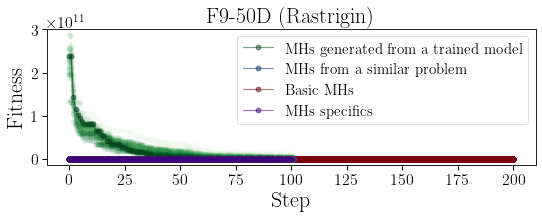

F10 2


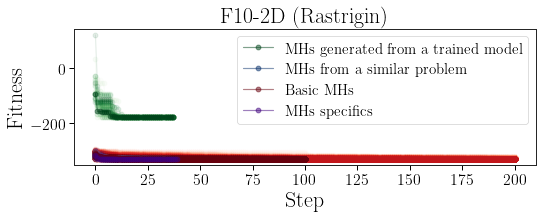

F10 10


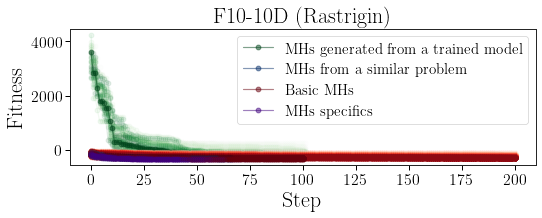

F10 30


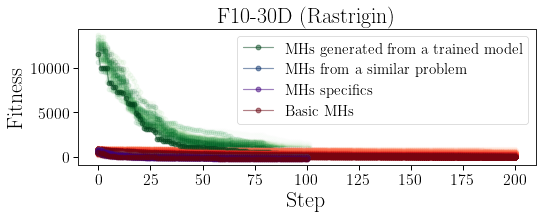

F10 50


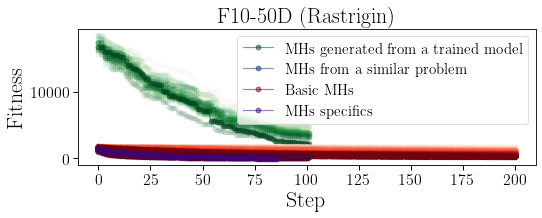

F11 2


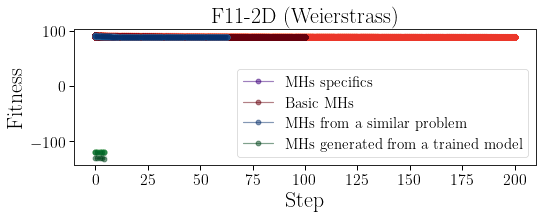

F11 10


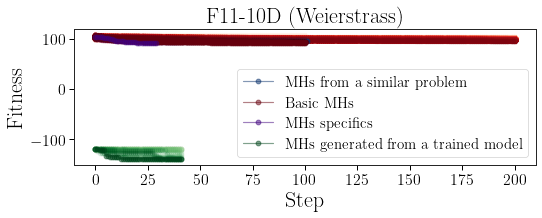

F11 30


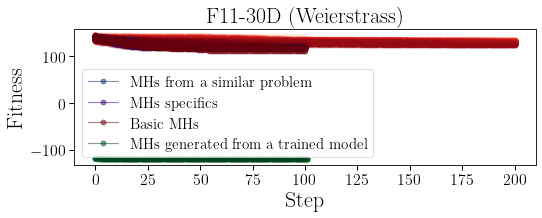

F11 50


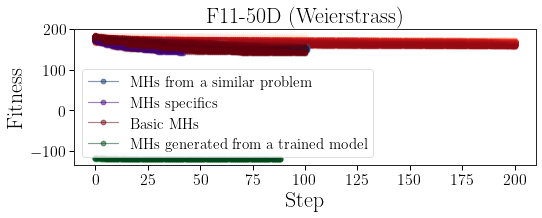

F13 2


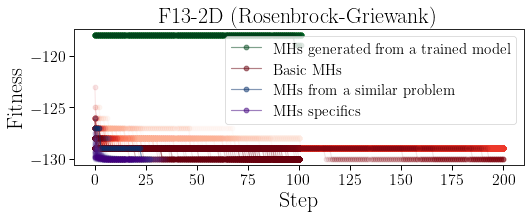

F13 10


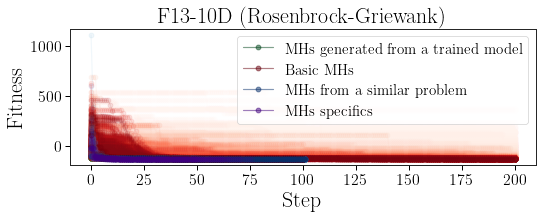

F13 30


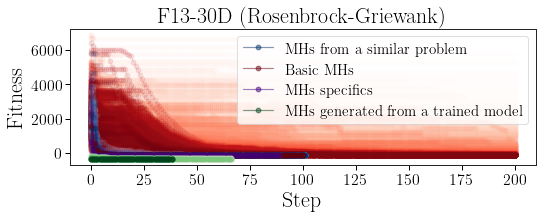

F13 50


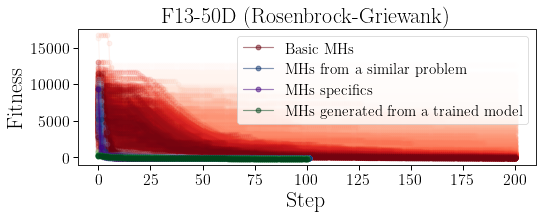

F14 2


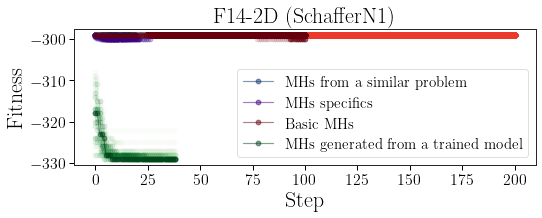

F14 10


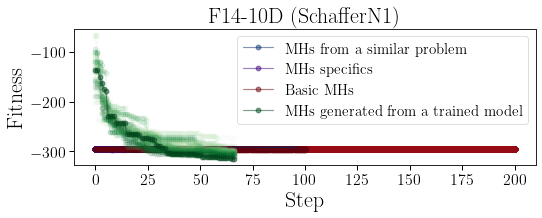

F14 30


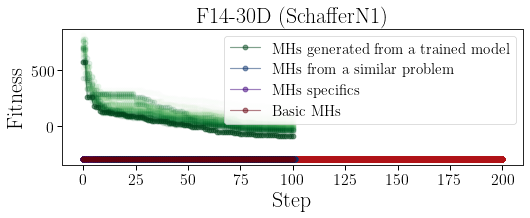

F14 50


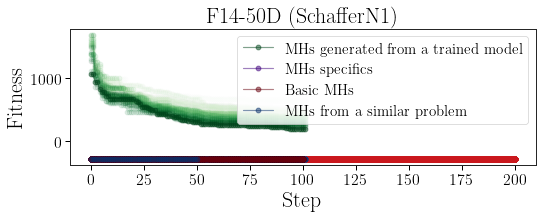

In [26]:
prove_comparison_fitness([0, 1, 2, 3], True)

In [30]:
def compute_performance(ids, data):
  performances = []
  for id in ids:
    last_fitness = [x[-1] for x in data['fitness'][id]]
    performances.append(np.median(last_fitness) + st.iqr(last_fitness))
  return performances 

def compute_percentage(perf_A, perf_B, verbose=False):
  selection = np.array(np.array(perf_A) - perf_B) < 0
  if verbose:
    print(sum(selection))
    print(np.array(perf_A)[selection])
    print(len(perf_A))
  return 1 - sum(selection) / len(perf_A)

def get_statistics(arr):
  print(f'{np.mean(arr):.4f} +- {np.std(arr):.4f}')
  print("Mean:", np.mean(arr))
  print("Median:", np.median(arr))
  print("Max:", np.max(arr))
  print("Min:", np.min(arr))

In [31]:

  
percentage_performance_dict = {
  'bmhs': [],
  'non_specific': [],
  'generated': [],
  'specific': [],
}
performance_dict = {
  'bmhs': 0,
  'non_specific': 0,
  'generated': 0,
  'specific': 0,
}
list_perform_dict = {
  'bmhs': [],
  'non_specific': [],
  'generated': [],
  'specific': [],
}
for _ in range(66):
  list_perform_dict['bmhs'].append([])
for f_name, dim in important_problems:
  ids_bmhs = get_all_ids(f_name, dim, results_bmhs)
  ids_non_specific = get_all_ids(f_name, dim, results_dlstm)
  ids_generated = get_all_ids(f_name, dim, results_from_trained)
  ids_specific = get_all_ids(f_name, dim, data_info)
  
  performance_bmhs = compute_performance(ids_bmhs, results_bmhs)
  performance_non_specific = compute_performance(ids_non_specific, results_dlstm)
  performance_generated = compute_performance(ids_generated, results_from_trained)
  performance_specific = compute_performance(ids_specific, data_info)

  #print(f_name, dim)
  #  print(performance_bmhs, performance_generated, performance_non_specific, performance_specific)
  results_fname = {
    'bmhs': performance_bmhs,
    'non_specific': performance_non_specific,
    'generated': performance_generated,
    'specific': performance_specific
    }
  min_perf = []
  for name_case, perf_b_list in results_fname.items():
    #print(name_case)
    min_perf.append(np.min(perf_b_list))
    performance_case = max(compute_percentage(performance_bmhs, perf_b) for perf_b in perf_b_list)
    percentage_performance_dict[name_case].append(performance_case)
    if name_case == 'bmhs':
      #print(performance_bmhs, len(performance_bmhs))
      for i in range(66):
        list_perform_dict['bmhs'][i].append(performance_bmhs[i])
    else:
      list_perform_dict[name_case].append(np.min(perf_b_list))
      
  #print(compute_percentage(performance_bmhs, performance_generated[0]))
  #break
  performance_dict[list(results_fname.keys())[np.argmin(min_perf)]] += 1


In [23]:
stats_results = dict()
wilcoxon_alternativies = ['two-sided', 'greater', 'less']
exp_ids = ['non_specific', 'generated', 'specific']
for exp_idA in exp_ids:
    perf_idA = list(list_perform_dict[exp_idA])    
    # Experiments
    for exp_idB in exp_ids:
        perf_idB = list(list_perform_dict[exp_idB])    
        # Wilcoxon
        for alternative in wilcoxon_alternativies:
            if exp_idA != exp_idB:
                if perf_idA == perf_idB:
                    print(perf_idA)
                    print(exp_idA, exp_idB)
                    break
            _, p_value = st.wilcoxon(perf_idA, perf_idB, alternative=alternative) if exp_idA != exp_idB else (_, 1)
            stats_results[(exp_idA, exp_idB, 'wilcoxon', alternative)] = p_value
        # Percentage 
        #percentage = success_comparison(perf_idA, perf_idB)
        #stats_results[(exp_idA, exp_idB, 'percentage')] = np.mean(percentage)
    
    
    # Basic MHs
            
    for alternative in wilcoxon_alternativies:
        for exp_idB, perf_idB in enumerate(list_perform_dict['bmhs']):
            _, p_value = st.wilcoxon(perf_idA, perf_idB, alternative=alternative)    
            stats_results[(exp_idA, f'bMH_{exp_idB}', 'wilcoxon', alternative)] = p_value


              non_specific  generated  specific
non_specific           1.0       0.00      0.00
generated              0.0       1.00      0.45
specific               0.0       0.45      1.00


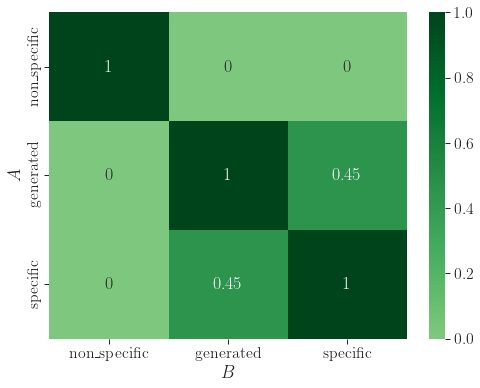

              non_specific  generated  specific
non_specific           1.0       1.00      1.00
generated              0.0       1.00      0.23
specific               0.0       0.77      1.00


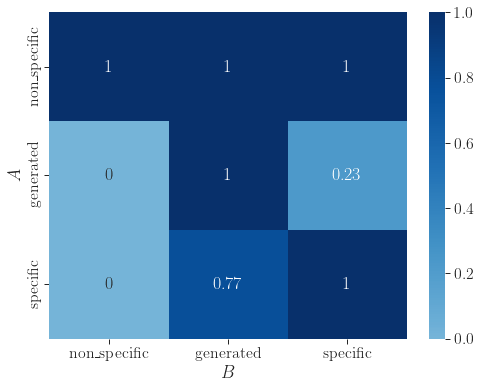

              non_specific  generated  specific
non_specific           1.0       0.00      0.00
generated              1.0       1.00      0.77
specific               1.0       0.23      1.00


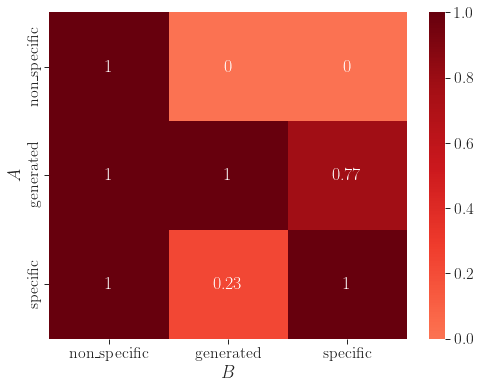

In [25]:
colors_alt = dict({
    'two-sided': 'Greens',
    'less': 'Reds',
    'greater': 'Blues'
})
for alternative in wilcoxon_alternativies:
    fig, ax = plt.subplots(figsize=(8,6))
    plt.rc('font', size=18)     # family='serif',

    plt.rcParams['axes.labelsize'] = 18
    plt.rcParams['axes.titlesize'] = 18
    fig.subplots_adjust()
    #fig.tight_layout()
    dict_comparison = dict()

    for exp_idA in exp_ids:
        p_values_B = [stats_results[(exp_idA, exp_idB, 'wilcoxon', alternative)]
                        for exp_idB in exp_ids]
        dict_comparison[exp_idA] = [round(pvalue, 2) for pvalue in p_values_B]

    df_comparison = pd.DataFrame(dict_comparison, index=exp_ids)
    sns.heatmap(df_comparison, vmin=0, vmax=1, annot=True,  cmap=colors_alt[alternative], center=0.05)
    #ax.set_title(f'Alternative: {alternative}')
    ax.set_xlabel('$B$')
    ax.set_ylabel('$A$')
    print(df_comparison)
    if is_saving:
        folder_name = 'data_files/'
        results_file_name = 'mhs_unseen'
        show_always = True
        plt.savefig(folder_name + results_file_name + '_' + f'wilcoxon_all_pairs_{alternative}.' + saving_format,
                format=saving_format, dpi=333, bbox_inches="tight", transparent=True)
    if show_plots or (show_always and alternative == 'greater'):
        plt.show()



In [32]:
# Wilcoxon test (Alternative: Less)
p_value = 0.05

plt.rc('font', size=18)     
plt.rcParams['axes.labelsize'] = 21
plt.rcParams['axes.titlesize'] = 21

for exp_id in exp_ids:
    # Dataframe
    p_values_bMHs = [stats_results[(exp_id, f'bMH_{bMH}', 'wilcoxon', 'less')]
                     for bMH in list(range(66))]
    df_pvalues = pd.DataFrame({'Basic MH': list(range(66)),
                               'p-value': p_values_bMHs })
    # Plot
    fig, ax = plt.subplots(figsize=(6,4))
    fig.subplots_adjust()
    barplottt = sns.barplot(x=df_pvalues['Basic MH'], y=df_pvalues['p-value'], palette='tab10')
    ax.axhline(y=p_value, color='black', linestyle='--')
    barplottt.set_yscale('log')
    barplottt.set(xticks=[])
    ax.set_xlabel('Basic metaheuristics')
    ax.set_ylabel('$p$-value')
    ax.set_title(f"Wilcoxon test ({exp_id})")
    id_text = exp_id.replace('\\', '')

    if is_saving:
        plt.savefig(figures_folder +  f'{id_text}_pvalue_log_scale.' + saving_format,
                format=saving_format, dpi=333, bbox_inches="tight", transparent=True)
    if show_plots:
        plt.show()

NameError: name 'exp_ids' is not defined

In [33]:
performance_dict

{'bmhs': 26, 'non_specific': 2, 'generated': 12, 'specific': 8}

In [34]:
suma_total = sum(performance_dict.values())
for key, value in performance_dict.items():
  print(key, value/suma_total * 100)

bmhs 54.166666666666664
non_specific 4.166666666666666
generated 25.0
specific 16.666666666666664


In [35]:
suma_total = sum(performance_dict.values())
for key, value in performance_dict.items():
  print(key, value/suma_total * 100)

bmhs 54.166666666666664
non_specific 4.166666666666666
generated 25.0
specific 16.666666666666664


In [36]:
suma_total = sum(performance_dict.values())
for key, value in performance_dict.items():
  print(key, value/suma_total * 100)

bmhs 54.166666666666664
non_specific 4.166666666666666
generated 25.0
specific 16.666666666666664


In [37]:
get_statistics(sum(list(percentage_performance_dict.values())[1:], []))

0.9104 +- 0.1849
Mean: 0.9103535353535354
Median: 0.9848484848484849
Max: 1.0
Min: 0.10606060606060608


In [38]:
get_statistics(percentage_performance_dict['non_specific'])

0.8860 +- 0.1609
Mean: 0.8860479797979798
Median: 0.9621212121212122
Max: 1.0
Min: 0.2272727272727273


In [39]:
get_statistics(percentage_performance_dict['generated'])

0.9470 +- 0.1365
Mean: 0.9469696969696969
Median: 0.9848484848484849
Max: 1.0
Min: 0.12121212121212122


In [40]:
get_statistics(percentage_performance_dict['specific'])

0.8980 +- 0.2365
Mean: 0.8980429292929294
Median: 0.9848484848484849
Max: 1.0
Min: 0.10606060606060608


In [41]:
get_statistics(percentage_performance_dict['bmhs'])

1.0000 +- 0.0000
Mean: 1.0
Median: 1.0
Max: 1.0
Min: 1.0


1.15 96.21212121212122
2.15 98.48484848484848
3.15 98.48484848484848


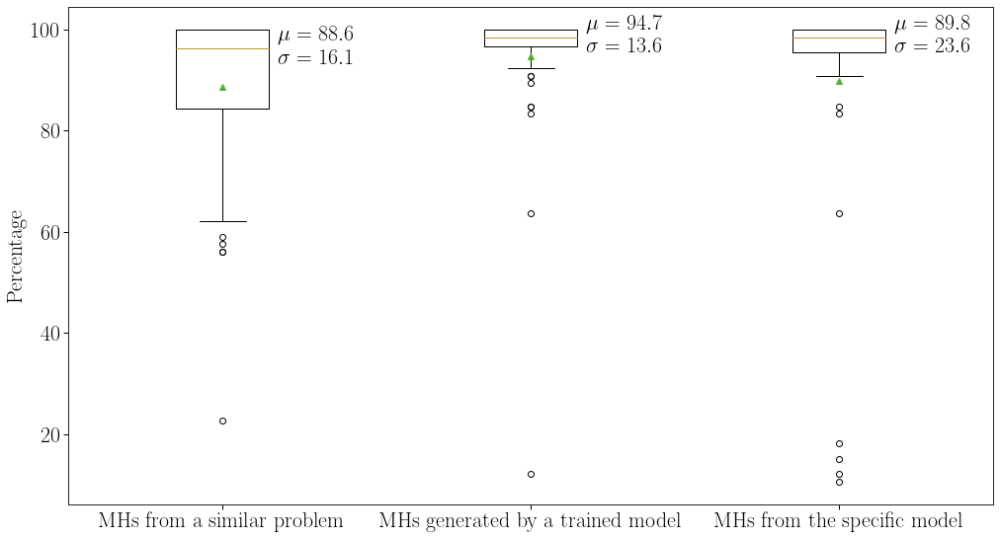

In [52]:
data = list(percentage_performance_dict.values())[1:]
data = [[y*100 for y in x] for x in data]
 
plt.rc('font', size=22)     # family='serif',

plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.titlesize'] = 22
ax.tick_params(axis='both', which='major', labelsize=22)
ax.tick_params(axis='both', which='minor', labelsize=22)
fig = plt.figure(figsize =(13, 7))

# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])
 
# Creating plot
bp = ax.boxplot(data, showmeans=True)
m1 = [np.mean(x) for x in data]
med1 = [np.median(x) for x in data]
st1 = [np.std(x) for x in data]

for i, line in enumerate(bp['medians']):
  x, y = line.get_xydata()[1]
  
  text = '\n'.join((
  r'$\mu=%.1f$' % (m1[i], ),
  #r'$\mathrm{median}=%.2f$' % (med1[i], ),
  r'$\sigma=%.1f$' % (st1[i], )))
  #print(text)
  print(x, y)
  ax.annotate(text, xy=(x+0.03, y-2.95))
ax.set_xticklabels(['MHs from a similar problem', 'MHs generated by a trained model', 'MHs from the specific model'])

plt.rc('font', size=22)     # family='serif',

plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.titlesize'] = 22
ax.tick_params(axis='both', which='major', labelsize=22)
ax.tick_params(axis='both', which='minor', labelsize=22)
fig.subplots_adjust()
fig.tight_layout()
plt.ylabel('Percentage')
# show plot
fig.savefig(figures_folder + 'bmhs_vs_strategies.' + saving_format, 
                    format=saving_format, bbox_inches="tight", dpi=333, transparent=True)
plt.show()

In [179]:
folder_name_models = './data_files/ml_models_times'
def get_cec_name(f_name, dim):
  return f'{folder_name_models}/{f_name}_CEC-{dim}D-default_nn_best_double_lstm_CEC-mem60_log.csv'


0.0299999993294477 6.149999862536779
0.0178999993950128 3.669499875977624


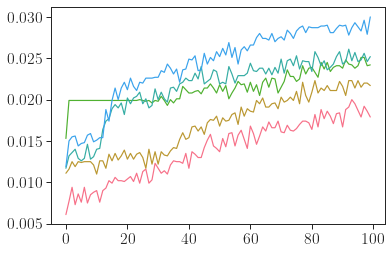

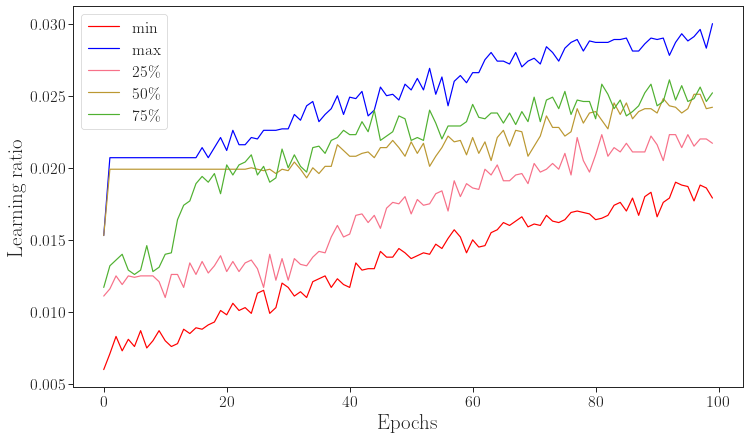

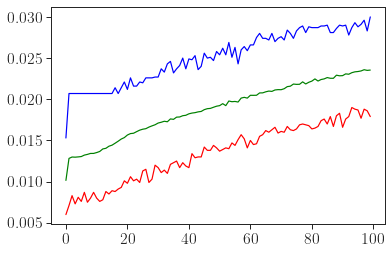

In [181]:
def learning_rate_batch_exp():
    very_top = 0
    very_bottom = 1

    dfs = []
    for f_name, dim in important_problems:                
        name = get_cec_name(f_name, dim)
        df = pd.read_csv(name)
        dfs.append(df)
        top_accuracy = max(df['accuracy'])
        top_accuracy = np.array(df['accuracy'])[-1]
        #print(np.argmax(df['accuracy']))

        very_top = max(very_top, top_accuracy)
        very_bottom = min(very_bottom, top_accuracy)

    if very_top == 0:
        return
    print(very_top, very_top/(1/len(encoded_heuristic_space['default.txt'])))
    print(very_bottom, very_bottom/(1/len(encoded_heuristic_space['default.txt'])))


    stats = dict({
        'min': [],
        'max': [],
        'mean': [],
        'median': [],
        '25qrt': [],
        '75qrt': [],
    })
    
    A = []
    for i in range(len(dfs)):
        A.append(len(dfs[i]['accuracy']))
    epochs = min(A)
    
    for i in range(epochs):
        row = [df['accuracy'][tl.listfind(df['epoch'], i)[-1]] for df in dfs]
        stats_row = st.describe(row)
        min_row, max_row = stats_row.minmax
        stats['min'].append(min_row)
        stats['max'].append(max_row)
        stats['mean'].append(stats_row.mean)
        #stats['median'].append(np.median(row))
        #stats['25qrt'].append(np.percentile(row, 25))
        #stats['75qrt'].append(np.percentile(row, 75))
    last_epoch = epochs-1
    last_row = [(df['accuracy'][tl.listfind(df['epoch'], last_epoch)[-1]], i) for i, df in enumerate(dfs)]
    last_row.sort()
    sz_last_row = len(last_row)
    _, qrt_1 = last_row[0]
    _, qrt_25 = last_row[sz_last_row//4]
    _, qrt_50 = last_row[sz_last_row//2]
    _, qrt_75 = last_row[(3*sz_last_row)//4]
    _, qrt_100 = last_row[-1]
    labels = ['min', '25\%', '50\%', '75\%', 'max']
    dfs_filtered = [dfs[qrt_1], dfs[qrt_25], dfs[qrt_50], dfs[qrt_75], dfs[qrt_100]]
    for df in dfs_filtered:
        epoch = [df['accuracy'][tl.listfind(df['epoch'], i)[-1]]  for i in range(epochs)]
        plt.plot(epoch)
        
    plt.show()
    
    fig = plt.figure(figsize=(12, 7))
    
    plt.rc('font', size=21)     # family='serif',

    plt.rcParams['axes.labelsize'] = 21
    plt.rcParams['axes.titlesize'] = 21

    plt.plot(stats['min'], color='red', label='min')
    plt.plot(stats['max'], color='blue',label='max')
    for df, label in zip(dfs_filtered[1:-1], labels[1:-1]):
        epoch = [df['accuracy'][tl.listfind(df['epoch'], i)[-1]]  for i in range(epochs)]
        plt.plot(epoch, label=label)
    plt.legend(loc='best')
    plt.xlabel('Epochs')
    plt.ylabel('Learning ratio')
    
    if is_saving:
        fig.savefig(figures_folder + 'learning_rate_cecdlstm.' + saving_format, 
                    format=saving_format, dpi=333, transparent=True)
    plt.show()
    
    plt.plot(stats['min'], color='red')
    plt.plot(stats['max'], color='blue')
    plt.plot(stats['mean'], color='green')
    
    #plt.plot(stats['median'], color='yellow')
    #plt.plot(stats['25qrt'], color='black')
    #plt.plot(stats['75qrt'], color='purple')
    
    #plt.xticks([])
    plt.show()  


    """
    for problem in all_problems:
        for dim in dimensions:
            
            name = get_model_name(problem, dim, exp_id)
            if name is None:
                break
            df = pd.read_csv(name)

            top_accuracy = max(df['accuracy'])
            
            top_accuracy = np.array(df['accuracy'])[-1]
            if top_accuracy != very_top:
                continue
            print(np.argmax(df['accuracy']))
            fig, ax = plt.subplots(figsize=(6,4))
            plt.title(name)
            plt.plot(df['accuracy'])
            #barplottt = sns.barplot(x=df['epoch'], y=df['accuracy'], palette='tab20')
            plt.xticks([])
            plt.show()  
    """
learning_rate_batch_exp()